### Set Params

In [2]:
import sys
import nltk
import gensim
import time
import numpy as np
import pandas as pd
import seaborn as sns
import re
import pickle
# from helpers import *
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import StratifiedKFold 
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from nltk.stem import WordNetLemmatizer
from sklearn.pipeline import Pipeline
from nltk.corpus import stopwords
from sklearn.decomposition import PCA
import lightgbm as lgb
from sklearn import metrics
import os
from matplotlib import pyplot as plt
from nltk.stem.porter import *
from googletrans import Translator
from joblib import parallel_backend # added line.
from ray.util.joblib import register_ray # added line.
#from tune_sklearn import TuneGridSearchCV

from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import GridSearchCV,HalvingGridSearchCV
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import classification_report


from xgboost import XGBClassifier
from sklearn import svm
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer
#from nltk.tokenize import word_tokenize,pos_tag

from nltk import word_tokenize, pos_tag
nltk.download('averaged_perceptron_tagger')

from joblibspark import register_spark



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [1]:
column_to_predict = "Assignmentgroup"
# Supported datasets:
# ticket_type
# business_service
# category
# impact
# urgency
# sub_category1
# sub_category2

classifier = "LR"  # Supported algorithms # "SVM" # "NB"
use_grid_search = True  # grid search is used to find hyperparameters. Searching for hyperparameters is time consuming
remove_stop_words = False  # removes stop words from processed text
output_format = "string"
mode = 'tfidf'
stop_words_lang = 'english'  # used with 'remove_stop_words' and defines language of stop words collection
use_stemming = False  # word stemming using nltk
fit_prior = True  # if use_stemming == True then it should be set to False ?? double check
min_data_per_class = 1  # used to determine number of samples required for each class.Classes with less than that will be excluded from the dataset. default value is 1

## Importing Ticket Details

In [3]:
dfTickets = pd.read_excel(r'D:\datascience\support_ticket_classification\SupportTicketData.xlsx',engine='openpyxl')
dfTickets.head(50)

,Number,Priority,State,Assignment group,Assigned to,Description,Close code,Close notes,Opened,Resolved,Resolved by,Severity,Closed,Closed by,Configuration item,Incident Type,Category,Caller
0,INC0010002,3 - Moderate,Closed,RCI APAC,Yuanqiang Alan Choo,Wallboard not working,Restart Service,Vendor - Tecnomic has fixed the issue by resta...,2016-10-16 19:04:50,2016-10-17 01:19:34,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:10,Neil Cochrane,Aspect Software Unified IP 7.2,Reactive,Software/Application,Rachael Towns
1,INC0010003,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,Mapped drives missing,User Education,"remapped network driver for user, user acknowl...",2016-10-16 19:08:53,2016-10-17 01:28:28,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:05,Scott Franetovich,System,Reactive,Logical Access,Tracey Goll
2,INC0010005,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,Not able to login to Aspect,Reset Pin,"reset LAN password for user, tested working fine.",2016-10-16 21:06:11,2016-10-17 01:29:53,Yuanqiang Alan Choo,3 - Low,2016-10-21 18:00:03,NaN,49682,Reactive,Logical Access,Tanya Curtis
3,INC0010006,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,LAN & EVS password reset - user was away for a...,Reset Pin,"Password reset for LAN and EVS, updated user, ...",2016-10-16 21:08:59,2016-10-17 01:30:51,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:06,NaN,Active Directory,Reactive,Logical Access,Geraldine Tan
4,INC0010009,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,not able to login to account,Reset Pin,"troubleshoot securedoc for user, reset LAN pas...",2016-10-16 21:14:39,2016-10-17 01:31:42,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:06,NaN,Active Directory,Reactive,Logical Access,Sabrina Pong
5,INC0010011,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,not able to connect to printer (HR),Reinstall,"reinstall printer, tested ok",2016-10-16 21:17:46,2016-10-17 01:32:23,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:06,NaN,Printer Support,Reactive,Printing,June Ang
6,INC0010012,3 - Moderate,Closed,RCI APAC,Yuanqiang Alan Choo,"No connectivity to network, was also informed ...",Connectivity Issue,"Rebooted DC2, connectivity back to normal.",2016-10-16 21:19:53,2016-10-17 01:34:28,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:08,NaN,NaN,Reactive,Contact Center,Kean Haw Ong
7,INC0010014,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,i have an outlook issue i have never seen\ni c...,Application Error,Remove corrupted profile and reinstalled. Upda...,2016-10-16 21:24:13,2016-10-17 01:38:20,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:10,NaN,O365 email,Reactive,Contact Center,Kate Robertson
8,INC0010015,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,not able to login to aspect,Account Locked,"account was untouched for a month, reset LAN a...",2016-10-16 21:46:26,2016-10-17 01:48:09,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:07,NaN,Active Directory,Reactive,Contact Center,Geraldine Tan
9,INC0010016,4 - Low,Closed,RCI APAC,Yuanqiang Alan Choo,"Hi Alan,\n\nI am trying to open the path below...",Permissns Issue,"As requested, add Mak into leadership team. ac...",2016-10-16 21:47:44,2016-10-17 01:43:09,Yuanqiang Alan Choo,3 - Low,2016-10-20 02:00:04,NaN,usflube8 1.0,Reactive,Contact Center,Kai Hoe Mak


## Exploratory Data Analysis

In [ ]:
dfTickets.shape

(235013, 18)

There are almost 2.3 lakhs of ticket data and 18 feature columns . 
We need to analyze each one the feature column to understand whether these columns are required for our modeling

In [ ]:
dfTickets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235013 entries, 0 to 235012
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Number              235013 non-null  object        
 1   Priority            235013 non-null  object        
 2   State               235013 non-null  object        
 3   Assignment group    235013 non-null  object        
 4   Assigned to         200874 non-null  object        
 5   Description         234908 non-null  object        
 6   Close code          178855 non-null  object        
 7   Close notes         211461 non-null  object        
 8   Opened              235013 non-null  datetime64[ns]
 9   Resolved            227055 non-null  datetime64[ns]
 10  Resolved by         226976 non-null  object        
 11  Severity            235013 non-null  object        
 12  Closed              226570 non-null  datetime64[ns]
 13  Closed by           207138 no

Lets understand each one of the feature column and decide whether its required to create our ML model.
Number :- Incident Number 
Priority :- Priority of the ticket 1 to 4 . 1 being more prioritized
State:- Status of the ticket
Assignment Group :- Group where it is assigned
Assigned To :- Person whom the ticket is being assigned in the group

#### Our target column will be 1. Assigned group and 2. Severity/Priority

In [ ]:
dfTickets.isna().sum().to_frame() #Checking null values

,0
Number,0
Priority,0
State,0
Assignment group,0
Assigned to,34139
Description,105
Close code,56158
Close notes,23552
Opened,0
Resolved,7958


Assign to , Close code , Closed and Closed by have null/zero values. However these columns will not be required to find the TARGET coulmn

#### Checking duplicate tickets by number

In [ ]:
sum(dfTickets['Number'].value_counts()>1) 

0

There are no duplicate tickets 

#### Dropping less important features 

In [ ]:
# Remove redundant columns 
dfTickets = dfTickets.drop(['Number'], axis = 1) 
dfTickets =dfTickets.drop(['State'], axis = 1) 
dfTickets =dfTickets.drop(['Assigned to'], axis = 1) 
dfTickets =dfTickets.drop(['Close code'], axis = 1) 
dfTickets =dfTickets.drop(['Close notes'], axis = 1) 
dfTickets =dfTickets.drop(['Resolved'], axis = 1) 
#dfTickets =dfTickets.drop(['Opened'], axis = 1) 
dfTickets =dfTickets.drop(['Closed'], axis = 1) 
dfTickets =dfTickets.drop(['Closed by'], axis = 1) 
dfTickets =dfTickets.drop(['Resolved by'], axis = 1) 
dfTickets =dfTickets.drop(['Caller'], axis = 1) 
dfTickets =dfTickets.drop(['Incident Type'], axis = 1)

#### Lets review 50 data now

In [ ]:
dfTickets.head(20)

,Priority,Assignment group,Description,Opened,Severity,Configuration item,Category
0,3 - Moderate,RCI APAC,Wallboard not working,2016-10-16 19:04:50,3 - Low,Aspect Software Unified IP 7.2,Software/Application
1,4 - Low,RCI APAC,Mapped drives missing,2016-10-16 19:08:53,3 - Low,System,Logical Access
2,4 - Low,RCI APAC,Not able to login to Aspect,2016-10-16 21:06:11,3 - Low,49682,Logical Access
3,4 - Low,RCI APAC,LAN & EVS password reset - user was away for a...,2016-10-16 21:08:59,3 - Low,Active Directory,Logical Access
4,4 - Low,RCI APAC,not able to login to account,2016-10-16 21:14:39,3 - Low,Active Directory,Logical Access
5,4 - Low,RCI APAC,not able to connect to printer (HR),2016-10-16 21:17:46,3 - Low,Printer Support,Printing
6,3 - Moderate,RCI APAC,"No connectivity to network, was also informed ...",2016-10-16 21:19:53,3 - Low,NaN,Contact Center
7,4 - Low,RCI APAC,i have an outlook issue i have never seen\ni c...,2016-10-16 21:24:13,3 - Low,O365 email,Contact Center
8,4 - Low,RCI APAC,not able to login to aspect,2016-10-16 21:46:26,3 - Low,Active Directory,Contact Center
9,4 - Low,RCI APAC,"Hi Alan,\n\nI am trying to open the path below...",2016-10-16 21:47:44,3 - Low,usflube8 1.0,Contact Center


#### Renaming feature group for easier understanding

In [ ]:
dfTickets = dfTickets.rename(columns={'Assignment group': 'Assignmentgroup', 'Configuration item': 'ConfigurationItem'})

In [ ]:
dfTickets.head()

,Priority,Assignmentgroup,Description,Opened,Severity,ConfigurationItem,Category
0,3 - Moderate,RCI APAC,Wallboard not working,2016-10-16 19:04:50,3 - Low,Aspect Software Unified IP 7.2,Software/Application
1,4 - Low,RCI APAC,Mapped drives missing,2016-10-16 19:08:53,3 - Low,System,Logical Access
2,4 - Low,RCI APAC,Not able to login to Aspect,2016-10-16 21:06:11,3 - Low,49682,Logical Access
3,4 - Low,RCI APAC,LAN & EVS password reset - user was away for a...,2016-10-16 21:08:59,3 - Low,Active Directory,Logical Access
4,4 - Low,RCI APAC,not able to login to account,2016-10-16 21:14:39,3 - Low,Active Directory,Logical Access


In [ ]:
dfTickets.tail()

,Priority,Assignmentgroup,Description,Opened,Severity,ConfigurationItem,Category
235008,4 - Low,WVC Application L1 Support,"Informatica failures, Long runnings, unschedul...",2021-11-16 06:16:59,3 - Low,INFORMATICA - PC,Request
235009,4 - Low,WVC Application L1 Support,"Informatica failures, Long runnings, unschedul...",2021-11-16 06:18:01,3 - Low,INFORMATICA - PC,Request
235010,4 - Low,RCI Application Support L1,"Somasundharm, Sabarinathan\nTue 11/16/2021 4:3...",2021-11-16 06:21:07,3 - Low,Autosys,Request
235011,3 - Moderate,WVC Fusion L2 Support,Reprocessing Legacy Contact Error queue messag...,2021-11-16 06:29:23,3 - Low,Oracle Fusion Middleware,Request
235012,4 - Low,WVC Infrastructure Middleware,"Hi Team,\n\nPlease restart RES ODM Tomcat Test...",2021-11-16 06:47:34,3 - Low,Apache Tomcat,Request


#### EDA Univariate Analysis

#### Priority

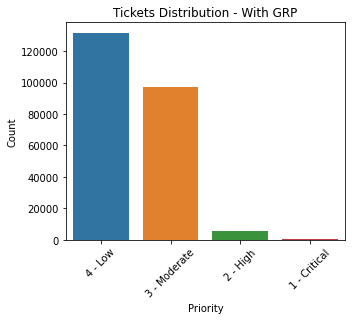

In [ ]:
#Plot line graph and view counts of each tickets - After GRP

plt.subplots(figsize = (5,4))

sns.countplot(x='Priority', data=dfTickets,order = dfTickets['Priority'].value_counts().index)
plt.xlabel('Priority') 
plt.ylabel('Count') 
plt.xticks(rotation=45)
plt.title('Tickets Distribution - With GRP')
plt.show()

In [ ]:
dfTickets['Priority'].value_counts().to_frame()

,Priority
4 - Low,131693
3 - Moderate,97246
2 - High,5745
1 - Critical,329


Observarions:

    There are total 4 types of priority. Low , moderate , high and critical where Low has the highest ticket count and critical has the lowest ticket count. It is clear that there is imbalance data set in this target column. We are considering assigning priority as one of the target column. we will rename this to Low as 4 , Moderate as 3, High as 2 and Critical as 1.

#### Assignment Group

In [ ]:
dfTickets['Assignmentgroup'].value_counts().to_frame()

,Assignmentgroup
WVC Application L1 Support,28511
RCI LATAM Uruguay Help Desk,23110
RCI Desktop EME,16931
WVC DB Oracle Support,11540
RCI LATAM Mexico Service Desk,11029
...,...
WVC Program Mgmt,1
RCI B2C Tower,1
RCI Decom,1
WDN RCI LATAM Colombia Service Desk,1


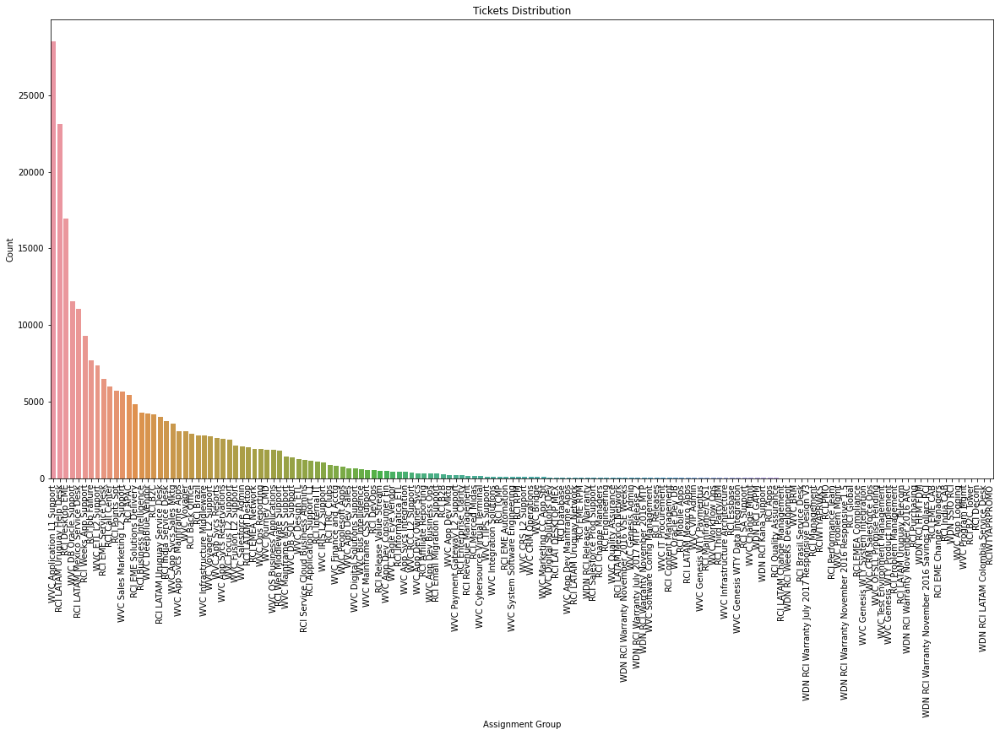

In [ ]:
#Plot line graph and view counts of each tickets

plt.subplots(figsize = (20,10))

sns.countplot(x='Assignmentgroup', data=dfTickets,order = dfTickets['Assignmentgroup'].value_counts().index)
plt.xlabel('Assignment Group') 
plt.ylabel('Count') 
plt.xticks(rotation=90)
plt.title('Tickets Distribution')

plt.show()

Observartions:
    
    There is lot of imbalance in the data.
    WVC Application L1 Support group - has the highest number of tickets and RCI Decom has the lowest number of tickets.
    Groups which has lowest number of tickets needs to clustered into one group and require manual intervention later to 
    assign the tickets into right group.




#### Severity

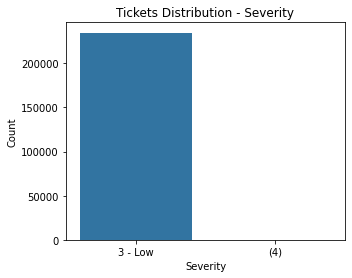

In [ ]:
#Plot line graph and view counts of each tickets - After GRP

plt.subplots(figsize = (5,4))
sns.countplot(x='Severity', data=dfTickets,order = dfTickets['Severity'].value_counts().index)
plt.xlabel('Severity') 
plt.ylabel('Count') 
plt.title('Tickets Distribution - Severity')
plt.show()

In [ ]:
dfTickets['Severity'].value_counts().to_frame()

,Severity
3 - Low,234745
(4),268


Observations:
    
    Severity - Low is the highest and seems all the tickets after resolution has been brought down to low. This feature column is a reduntant one and can be omitted out.

#### Category

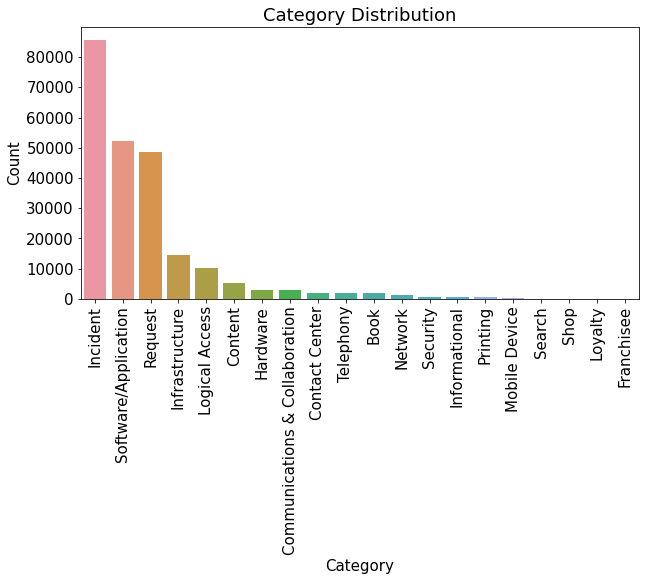

In [ ]:
#Plot line graph and view counts of each tickets

plt.subplots(figsize = (10,5))

sns.countplot(x='Category', data=dfTickets,order = dfTickets['Category'].value_counts().index)
plt.xlabel('Category') 
plt.ylabel('Count') 
plt.xticks(rotation=90)
plt.title('Category Distribution')

plt.show()

In [ ]:
dfTickets['Category'].value_counts().to_frame()

,Category
Incident,85660
Software/Application,52337
Request,48538
Infrastructure,14655
Logical Access,10069
Content,5162
Hardware,3109
Communications & Collaboration,2898
Contact Center,2037
Telephony,2000


Observations:
    
    Highly imbalanced data set.Incident has the highest categorization followed by Software applications and request.Franchisee has the lowest. This can be consider as another target variable which can derived from description. 

#### EDA Bivariate Analysis

#### Number of priority ticket per category

<AxesSubplot:title={'center':'Number of priorities per category'}, ylabel='Category'>

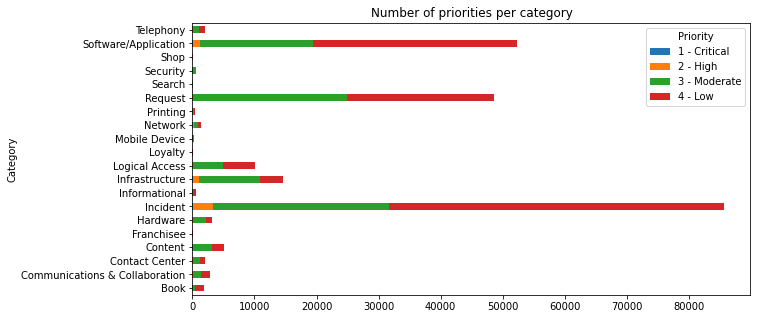

In [ ]:
dfTickets.groupby(['Category', 'Priority']).size().unstack().plot(kind='barh', stacked=True, title="Number of priorities per category",figsize = (10,5))

Observatons:
    
    Shop and Francise category almost have zero tickets
    Security category has tickets tagged as moderate
    Most of the categories have tickets with low to be more than other priorities
    Critical tickets are very few suggesting stability of the applications

In [ ]:
dfTickets.groupby(['Assignmentgroup','Priority']).size().unstack()

Priority,1 - Critical,2 - High,3 - Moderate,4 - Low
Assignmentgroup,,,,
RCI APAC,12.0,19.0,595.0,4782.0
RCI Affiliate Reporting,NaN,NaN,85.0,229.0
RCI Application Support L1,NaN,NaN,41.0,1083.0
RCI Apps,NaN,NaN,5.0,6.0
RCI B2B,2.0,12.0,54.0,210.0
...,...,...,...,...
WVC Test Environment Management,NaN,NaN,2.0,1.0
WVC VIP Admin,NaN,NaN,4.0,15.0
WVC Voyager,26.0,76.0,1087.0,1855.0


In [ ]:
# figure and axis
dfTickets.groupby(['Assignmentgroup','Priority']).size().unstack().plot(kind='barh', stacked=True,figsize = (200,200),width=1.0,fontsize=90)
plt.rcParams.update({'font.size': 15})
plt.show()

Final Observation from EDA:
    
    Target groups : Assignement group,Priority,Category.
    For each target group we have highly imbalance data.
    Severity feature can be removed as it will have no impact 
    235013 incident
    18 feature
    No duplicate tickets 
    Critical ticket are very less proving system stability
    Incident is highest category with 85660 number of tickets assigned
    WVC Application L1 Support is the largest Assignment group with 28511 tickets
    Priority 4 are the highest number of tickets

#### Data Wrangling

#### Null or Empty value checking

In [ ]:
dfTickets.isna().sum().to_frame() #Checking null values

,0
Priority,0
Assignmentgroup,0
Description,105
Opened,0
Severity,0
ConfigurationItem,7332
Category,3324


We have null values in description, configuration items and category.

In [ ]:
# Copying it into new dataframe
df_Tickets_new = dfTickets.copy()   

In [ ]:
df_Tickets_new.shape

(235013, 7)

In [ ]:
#Removed any rows where we have null or empty values for Description feature
#df_Tickets_new.dropna(subset = ['Description'], inplace = True) 
#df_Tickets_new.isna().sum().to_frame() #Checking null values

Removed any rows where we have null or empty values for Description feature

In [ ]:
df_Tickets_new.isna().sum().to_frame() #Checking null values

,0
Priority,0
Assignmentgroup,0
Description,105
Opened,0
Severity,0
ConfigurationItem,7332
Category,3324


#### Reviewing Assignment group

Assignment group will be our target group . The ML model needs to derive insight from the description feature and 
define which group it will be assigned.

In [ ]:
pd.set_option('display.max_rows', None)

Lets view all the groups with ticket assigned more than 200 . We will see what is the lowest group of tickets which can help the model to learn well.Rest we will put into one single class/label as with small number of tickets it will be hard for the model to learn. 

In [ ]:
df_Tickets_new['Assignmentgroup'].value_counts().loc[lambda x : x>200].to_frame() 

,Assignmentgroup
WVC Application L1 Support,28511
RCI LATAM Uruguay Help Desk,23110
RCI Desktop EME,16931
WVC DB Oracle Support,11540
RCI LATAM Mexico Service Desk,11029
RCI Weeks App Support,9293
RCI Job Failure,7710
WVC ETL L2 Support,7345
RCI EME Service Desk,6458
RCI Call Center,5994


Assignment group with less than 200 tickets 

In [ ]:
df_Tickets_new['Assignmentgroup'].value_counts().loc[lambda x : x<200].to_frame() 

,Assignmentgroup
WVC Payment Gateway L2 Support,193
RCI Enterprise Clarity,175
RCI Revenue Management,172
RCI Merced Midas,170
WVC Cybersource Virtual Terminal,135
WVC TIPS Support,116
WVC Integration Solutions,116
RCI TCMP,107
RCI EME Automation,102
WVC System Software Engineering,96


In [ ]:
df_Tickets_new.groupby('Assignmentgroup').describe()

C:\Users\119166\AppData\Local\conda\conda\envs\py36\lib\site-packages\pandas\core\groupby\groupby.py:1631: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  result = self.apply(lambda x: x.describe(**kwargs))
C:\Users\119166\AppData\Local\conda\conda\envs\py36\lib\site-packages\pandas\core\groupby\groupby.py:1631: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  result = self.apply(lambda x: x.describe(**kwargs))
C:\Users\119166\AppData\Local\conda\conda\envs\py36\lib\site-packages\pandas\core\groupby\groupby.py:1631: FutureWarning: Treating datetime data as categorical rather than numeric in `

Priority         \
                                                      count unique   
Assignmentgroup                                                      
RCI APAC                                               5408      4   
RCI Affiliate Reporting                                 314      2   
RCI Application Support L1                             1124      2   
RCI Apps                                                 11      2   
RCI B2B                                                 278      4   
RCI B2C                                                4162      4   
RCI B2C Tower                                             1      1   
RCI Back Office                                        2889      4   
RCI Brasil Service Desk                                   6      2   
RCI Brazil                                             2816      3   
RCI Business Intelligence                              4252      3   
RCI Call Center                                        5994      4   
RCI Change Managers                                      38      3   
RCI Content Management                                   21      2   
RCI Database                                             61      2   
RCI Decom                                                 1      1   
RCI Desktop EME                                       16931      3   
RCI DevOps                                              531      3   
RCI EME Automation                                      102      2   
RCI EME CAB                                               2      2   
RCI EME Change Managers                                   2      1   
RCI EME RPM                                              40      2   
RCI EME Service Desk                                   6458      4   
RCI EME Solutions Delivery                             4814      3   
RCI EMEA Compliance                                       3      1   
RCI EMEA Network                                       1923      4   
RCI Email Migration Support                             300      3   
RCI Engineering                                          35      2   
RCI Enterprise Clarity                                  175      2   
RCI Essbase                                              14      2   
RCI Global                                                4      2   
RCI India CAB                                             2      1   
RCI India Service Desk                                 3706      4   
RCI Informatica ETL                                     416      3   
RCI Internal IT                                        1094      4   
RCI Job Failure                                        7710      3   
RCI LAT DESKTOP MEX                                      61      3   
RCI LATAM Change Management                               9      2   
RCI LATAM Desktop                                      2036      3   
RCI LATAM Mexico Apps                                    19      3   
RCI LATAM Mexico Network                                 33      4   
RCI LATAM Mexico Service Desk                         11029      4   
RCI LATAM Uruguay Help Desk                           23110      2   
RCI LATAM Uruguay Network                                41      4   
RCI LATAM Uruguay Service Desk                         4000      4   
RCI LATAM Uruguay Telecom                                 2      1   
RCI Mainframe/EVS1                                       17      3   
RCI Management                                            5      1   
RCI Merced Midas                                        170      3   
RCI Mobile Apps                                          19      2   
RCI PMO                                                   5      1   
RCI Performance Team                                      5      2   
RCI Points Spt                                         5728      4   
RCI Problem Management                                    2      2   
RCI Purchasing                                            2  

#### Understand Description - Column of interest

In [ ]:
df_Tickets_new['Description'].head(50)

0                                 Wallboard not working
1                                 Mapped drives missing
2                           Not able to login to Aspect
3     LAN & EVS password reset - user was away for a...
4                          not able to login to account
5                   not able to connect to printer (HR)
6     No connectivity to network, was also informed ...
7     i have an outlook issue i have never seen\ni c...
8                           not able to login to aspect
9     Hi Alan,\n\nI am trying to open the path below...
10     account locked, not able to go internet webpage 
11    \nTeam can we add Tania Riddell to the distrib...
12    Hi Team,\n\nAppreciate if you could help to ar...
13                  Outlook keep prompting for password
14    From: Ong, Barry \nSent: Monday, October 17, 2...
15                                  LAN password locked
16                                       Account locked
17                                       account

In [ ]:
row = 300
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Description'][row+var])

Description :::
Hola, buenas tardes, 

Por favor, podrían configurarle la impresora de facturación a Micaela Blanco?

Muchas gracias. 
Saludos 

Description :::
acceso a \\rciuy-nas\facturas  para Micaela Blanco
Description :::
Please open a ticket and assign to BI

Can you please redeploy SAS codes

Sas_u_revmgt_club_recon_dbl_deps_dly
Sas_u_revmgt_club_recon_evs1_deps_dly

Change:
  /*Update By: Jia Heng
  Update Desc: join with grid_new table on club to avoid duplication
  Update Date: 20161018 */;

Thanks

Jia Heng
RCI
Revenue Management Reporting
14 Sylvan Way
Parsippany, NJ 07054
o: +1.973.753.6674
c: +1 973.452.1677
e: Jia.heng@rci.com<mailto:Jia.heng@rci.com>
Description :::
Contract number : az100964
Owner : Premier ownership(3500
System is not allowed to put in temporary signature choice that they should be getting
Description :::
Hi

I have come back from a weeks holiday and yesterday again my PC crashed on me twice and today it has happened 5 times!.
I have lost Excel work 

In [ ]:
row = 113367
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Description'][row+var])

Description :::
TEST EMAIL TO CREATE A INCIDENT
Description :::
TEST EMAIL TESTING LOG OF INCIDENT
Description :::
Caller: Natali Galarita
Contact Phone: (347) 920-8131
Available hours: Anytime. 
Time zone: EDT. 
Works at (Home/Office): Office. 
Detailed description: User does not have access to book tours (attached image). 
Description :::
And I also forgot my EVS1 password

Sebastian Sill
Assistant IT Manager, RCI APAC

RCI
223 Mountbatten Road #03-11, Singapore 398008
office:  +65 6412 2177
mobile: +65 8186 1289
e: sebastian.sill@rci.com<mailto:sebastian.sill@rci.com>

"The information in this electronic mail ("e-mail") message may contain information that is confidential and/or privileged, or may otherwise be protected by work product or other legal rules. It is solely for the use of the individual(s) or the entity(ies) originally intended. Access to this electronic mail message by anyone else is unauthorized. If you are not the intended recipient, be advised that any unauthorized 

In [ ]:
df_Tickets_new['Description'][8760]

'Hello,\nI need to cancel SB rel 36 and 39  (calendar incorrect) but these weeks have already been combined and utilised against exchanges rel 36 and 40.\nUnfortunately as these are past date (July 2016) I have no access to the exchange master.\nCould you please re-instate the exchange master for rel 36 and 40 so that I can proceed with the cancellation of the bookings, uncombine the weeks and deleted the deposits.\nThanks,\n\nCarla Simionescu\nHelp Desk  - RCI UK\nTel: +44 207 3659037\n\n[Description: Description: Description: Description:                Description: Description: Description: Description:                Description: Description: Description: Description:                Description: Description: Description:                cid:image001.jpg@01D00996.C38322C0]\nRCI Call Centre (Europe and Middle East)\nGround Floor, Western Unit, Blackrock Business Park, Bessboro Road\nBlackrock, Cork\nA Wyndham Worldwide Company'

In [ ]:
df_Tickets_new['Description'][10000]

"PLEASE ASSIGN TO THE BACK OFFICE QUEUE.\n\nThere are several thousand members with the wrong tier indicator in Oracle.\n\nLet me know if there's any additional information needed from me.\n\nThanks,\nJames\n\n\nJames Thompson\nBusiness Technology Analyst\nProduct Management & Resort Operations\nCreating Solutions * Driving Results\n\nRCI\n9998 North Michigan Road\nCarmel, Indiana 46032\no: +1.317.805.8049\nf: +1.317.805.8108\ne: james.thompson@rci.com<mailto:james.thompson@rci.com>\nwww.rciaffiliates.com<http://www.rciaffiliates.com/>"

In [ ]:
df_Tickets_new['Description'][50000]

'Hello,\n\nHappy New Year to you all!\n\nI need to reset password for TRVTSL1, can you please?\nThanks,\n\nAna Sánchez\nRCI\nAffiliate Account Support Coordinator, Business Development\nC/Palma del Río 19, 1ª planta oficina 2\n29004 Málaga, Spain\ntelf:  +34 951 089746\nfax:  +34 951 089749\nemail: Ana.Sanchez@rci.com<mailto:Ana.Sanchez@rci.com>\n\nRCI Europe\nRegistered Office: Kettering Parkway, Kettering, Northamptonshire, NN15 6EY\nRegistered in England and Wales. Company Registration Number 01148410\nVAT Registration Number: GB 217 70 47 68\n\nThe information in this electronic mail ("e-mail") message may contain information that is confidential and/or\nprivileged, or may otherwise be protected by work product or other legal rules. It is solely for the use of the\nindividual(s) or the entity(ies) originally intended.  Access to this electronic mail message by anyone else is\nunauthorized.\nIf you are not the intended recipient, be advised that any unauthorized review, disclosure, 

Observations:

	1. PCI and PII information present
	2. Email header and footer present
	3. Signature preset 
	4. Removing links, special characters
	5. @user present
	6. Special characters, numbers, punctuations present
    7. Phone number present 
    8. Image tagging present
    9. Email to and sent is there 


Number of words for each assignment group 

In [ ]:
df_Tickets_new['word_count'] = df_Tickets_new['Description'].apply(lambda x: len(str(x).split(" ")))

Number of characters

In [ ]:
df_Tickets_new['char_count'] = df_Tickets_new['Description'].str.len() ## this also includes spaces

In [ ]:
df_Tickets_new.head(50)

,Priority,Assignmentgroup,Description,Opened,Severity,ConfigurationItem,Category,word_count,char_count
0,3 - Moderate,RCI APAC,Wallboard not working,2016-10-16 19:04:50,3 - Low,Aspect Software Unified IP 7.2,Software/Application,3,21.0
1,4 - Low,RCI APAC,Mapped drives missing,2016-10-16 19:08:53,3 - Low,System,Logical Access,3,21.0
2,4 - Low,RCI APAC,Not able to login to Aspect,2016-10-16 21:06:11,3 - Low,49682,Logical Access,6,27.0
3,4 - Low,RCI APAC,LAN & EVS password reset - user was away for a...,2016-10-16 21:08:59,3 - Low,Active Directory,Logical Access,13,53.0
4,4 - Low,RCI APAC,not able to login to account,2016-10-16 21:14:39,3 - Low,Active Directory,Logical Access,6,28.0
5,4 - Low,RCI APAC,not able to connect to printer (HR),2016-10-16 21:17:46,3 - Low,Printer Support,Printing,7,35.0
6,3 - Moderate,RCI APAC,"No connectivity to network, was also informed ...",2016-10-16 21:19:53,3 - Low,NaN,Contact Center,19,104.0
7,4 - Low,RCI APAC,i have an outlook issue i have never seen\ni c...,2016-10-16 21:24:13,3 - Low,O365 email,Contact Center,14,73.0
8,4 - Low,RCI APAC,not able to login to aspect,2016-10-16 21:46:26,3 - Low,Active Directory,Contact Center,6,27.0
9,4 - Low,RCI APAC,"Hi Alan,\n\nI am trying to open the path below...",2016-10-16 21:47:44,3 - Low,usflube8 1.0,Contact Center,46,300.0


#### Data Cleaning

#### Remove Email Footer,greetings and Company Address

emailfooter_a  = "This email message (including all attachments) is for the sole use of the intended recipient(s) and may contain confidential information. If you are not the intended recipient, please contact the sender by reply email and destroy all copies of the original message. Unless otherwise indicated in the body of this email, nothing in this communication is intended to operate as an electronic signature and this transmission cannot be used to form, document, or authenticate a contract. Wyndham Worldwide Corporation and/or its affiliates may monitor all incoming and outgoing email communications in the United States, including the content of emails and attachments, for security, legal compliance, training, quality assurance and other purposes."
emailfooter_b = "If you are not the intended recipient, be advised that any unauthorized review, disclosure, copying, distribution or use of this information, or any action taken or omitted to be taken in reliance on it, is prohibited and may be unlawful. Please notify the sender immediately if you have received this electronic message by mistake, and destroy all copies of the original message.."
emailfooter_c = "The information in this electronic mail ('e-mail') message may contain information that is confidential and/or privileged, or may otherwise be protected by work product or other legal rules. It is solely for the use of the individual(s) or the entity(ies) originally intended.  Access to this electronic mail message by anyone else is unauthorized."
emailfooter_d = "The sender believes that this e-mail and any attachments were free of any virus, worm, Trojan horse, malicious code and/or other contaminants when sent. E-mail transmissions cannot be guaranteed to be secure or error-free, so this message and its attachments could have been infected, corrupted or made incomplete during transmission. By reading the message and opening any attachments, the recipient accepts full responsibility for any viruses or other defects that may arise, and for taking remedial action relating to such viruses and other defects. Neither Wyndham Worldwide Corporation nor any of it's affiliated entities is liable for any loss or damage arising in any way from, or for errors or omissions in the contents of, this message or its attachments."
greetings =['Good afternoon','Good morning']
addressess = ['Wyndham Vacation Ownership','6277 Sea Harbor Dr','Orlando, FL 32821','Thanks']

def remove_email_content(description):
        #print(description)
        try:
            if description==description:
                description = description.replace(emailfooter_a, "")
                description = description.replace(emailfooter_b, "")
                description = description.replace(emailfooter_c, "")
                description = description.replace(emailfooter_d, "")
                for greeting in greetings:
                    description  = description.replace(greeting, "")
                for addresses in addressess:
                    description = description.replace(addresses, "")
        except:
            print("Error occured")
        return description

In [ ]:
def remove_email_content(emailString):
        if emailString==emailString:
            footer = ["the information in this electronic mail", "this email message"] # A list containing email footers :: Keep all word in lower case
            # Split your email by line breaks and make everything lowercase
            emailLines = emailString.lower().split("\n")
            normalLines = emailString.split("\n")

            # Start and end points to extract the text
            start = -1
            end = len(emailLines) - 1
            containCnt = 0

            for i in range(len(emailLines)):
                line  = emailLines[i]

                # Check if any footer in this line
                if len([s for s in footer if s in line]) and end == len(emailLines) - 1:
                    containCnt = containCnt + 1

                if len([s for s in footer if s in line]) and end == len(emailLines) - 1:
                    end = i
                    break

            #Only footer is present        
            if end == 0 and containCnt > 0:
                return "\n"
            #Single line with no footer
            if end == 0 or containCnt == 0:
                return "\n".join(normalLines[:end+1])
            else:
                return "\n".join(normalLines[:end])
        else:
             return emailString


In [ ]:
df_Tickets_new['Cleaned_Description'] = df_Tickets_new['Description'].apply(remove_email_content)

In [ ]:
df_Tickets_new.shape

(235013, 10)

In [ ]:
df_Tickets_new.head(5)

,Priority,Assignmentgroup,Description,Opened,Severity,ConfigurationItem,Category,word_count,char_count,Cleaned_Description
0,3 - Moderate,RCI APAC,Wallboard not working,2016-10-16 19:04:50,3 - Low,Aspect Software Unified IP 7.2,Software/Application,3,21.0,Wallboard not working
1,4 - Low,RCI APAC,Mapped drives missing,2016-10-16 19:08:53,3 - Low,System,Logical Access,3,21.0,Mapped drives missing
2,4 - Low,RCI APAC,Not able to login to Aspect,2016-10-16 21:06:11,3 - Low,49682,Logical Access,6,27.0,Not able to login to Aspect
3,4 - Low,RCI APAC,LAN & EVS password reset - user was away for a...,2016-10-16 21:08:59,3 - Low,Active Directory,Logical Access,13,53.0,LAN & EVS password reset - user was away for a...
4,4 - Low,RCI APAC,not able to login to account,2016-10-16 21:14:39,3 - Low,Active Directory,Logical Access,6,28.0,not able to login to account


Taking a look into columns with email information

In [ ]:
row = 20000
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Description'][row+var])

Description :::
Good afternoon,

Please open a ticket for preview.myclubwyndham.com. If you navigate to the My Ownership > Ownership Details section, you will notice that in the contract area the expand/collapse (+/-) button is acting inconsistently.  Sometimes after user utilizes this function, the button disappears.  You can still select the area where it *should* be and it will expand or collapse, however the physical button is no longer displayed.  Please see the screenshot below.

[cid:image001.png@01D2C35B.A0A45450]

Thanks,
Jonathan Guidry
Digital Product Specialist
Digital Strategy
Wyndham Vacation Ownership
6277 Sea Harbor Dr.
Orlando, FL 32821
(863) 558-0851 ph

This email message (including all attachments) is for the sole use of the intended recipient(s) and may contain confidential information. If you are not the intended recipient, please contact the sender by reply email and destroy all copies of the original message. Unless otherwise indicated in the body of this email,

In [ ]:
row = 113364
for var in list(range(5)):
  #print("Description :::")
  print(df_Tickets_new['Cleaned_Description'][row+var])

Hello,
 
Please create a ticket for VCC records not hitting the DP Verification Report stored in the SFS.


Respectfully,
 
Tommie Higgins
Specialist, Account Onboarding III

Down Payment ASO
 
Wyndham Destinations
10750 W. Charleston Blvd. 
Suite 130
Las Vegas, NV 89135 
(702) 304-4176  phone

tommie.higgins@wyn.com

 


From: Kathiravan, Mohan Raj (Contractor) 

Sent: Tuesday, June 11, 2019 8:05 AM

To: Higgins, Tommie <Tommie.Higgins@wyn.com>; Vega, Rosa <Rosa.Vega@wyn.com>; Gopal Kalal, Venu (Contractor) <Venu.GopalKalal@wyn.com>

Subject: RE: Another VCC not reported for DP 641904302


 
Tommie,
 
Can you create a ticket?
 
Venu,
 
Can you tell what could be wrong with this contract in reporting side?

 

Thanks
Mohan Kathiravan
Consultant, IT
Wyndham Destinations
6277 Sea Harbor Drive
Orlando, FL -32821
Office: (407) 626-6130

 


From: Higgins, Tommie 

Sent: Tuesday, June 11, 2019 10:20 AM

To: Kathiravan, Mohan Raj (Contractor); Vega, Rosa

Subject: RE: Another VCC not reporte

#### Removing Punctuations and Special Characters

This function will  
    
    1. Move from upper case to lower case
    2. Removed email
    3. Removed numbers
    4. Remove new line charracter
    5. Remove hashtag
    6. Remove HTML Special entities
    7. Remove hyperlinks
    8. Remove any unreadable characters
    9. Remove any special character
    10.Remove any URL

In [ ]:
def clean_data(text):  
    if text==text:
        text=text.lower()
        text = re.sub(r"received from:",' ',text)
        text = re.sub(r"from:",' ',text)
        text = re.sub(r"to:",' ',text)
        text = re.sub(r"subject:",' ',text)
        text = re.sub(r"sent:",' ',text)
        text = re.sub(r"ic:",' ',text)
        text = re.sub(r"cc:",' ',text)
        text = re.sub(r"bcc:",' ',text)
        #Remove email 
        text = re.sub(r'\S*@\S*\s?', '', text)
        # Remove numbers 
        text = re.sub(r'\d+','' ,text)
        # Remove Non Dictionary character-TODO
        # Remove new line characters 
        text = re.sub(r'\n',' ',text)
        # Remove hashtag while keeping hashtag text
        text = re.sub(r'#','', text)
        #& 
        text = re.sub(r'&;?', 'and',text)
        # Remove HTML special entities (e.g. &amp;)
        text = re.sub(r'\&\w*;', '', text)
        # Remove hyperlinks
        text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
        # Remove characters beyond Readable formart by Unicode:
        text= ''.join(c for c in text if c <= '\uFFFF') 
        text = text.strip()
        # Remove unreadable characters  (also extra spaces)
        text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
        # Remove special character
        input_txt=text
        input_txt = input_txt.replace("won't", "will not")
        input_txt = input_txt.replace("cannot", "can not")
        input_txt = input_txt.replace("can't", "can not")
        input_txt = input_txt.replace("n't", " not")
        input_txt = input_txt.replace("what's", "what is")
        input_txt = input_txt.replace("it's", "it is")
        input_txt = input_txt.replace("'ve", " have")
        input_txt = input_txt.replace("i'm", "i am")
        input_txt = input_txt.replace("'re", " are")
        input_txt = input_txt.replace("he's", "he is")
        input_txt = input_txt.replace("she's", "she is")
        input_txt = input_txt.replace("'s", " own")
        input_txt = input_txt.replace("%", " percent ")
        input_txt = input_txt.replace("'ll", " will")
        ##--remove url
        input_txt = re.sub(r"\b\d{1,3}\.\d{1,3}\.\d{1,3}\.\d{1,3}\b", " IP ",input_txt)
        ##--remove URL
        input_txt = re.sub(r"(hxxp?|https|http)\S+", "URL",  input_txt)
        ##--remove the number
        input_txt = re.sub(r"[0-9]+", ' ', input_txt)
        if input_txt == ' ':
            input_txt =''
        special_char = '@_!#$%^&*()<>?/\|}{~:;[]-=,'
        for i in special_char:
            input_txt = input_txt.replace(i, ' ')
        return input_txt
    else:
        return text

In [ ]:
df_Tickets_new['Cleaned_Description'] = df_Tickets_new['Cleaned_Description'].apply(clean_data)

In [ ]:
df_Tickets_new.iloc[:,[2,7]].head(20)  

,Description,word_count
0,Wallboard not working,3
1,Mapped drives missing,3
2,Not able to login to Aspect,6
3,LAN & EVS password reset - user was away for a...,13
4,not able to login to account,6
5,not able to connect to printer (HR),7
6,"No connectivity to network, was also informed ...",19
7,i have an outlook issue i have never seen\ni c...,14
8,not able to login to aspect,6
9,"Hi Alan,\n\nI am trying to open the path below...",46


Lets look into the description of the data after cleaning 

In [ ]:
row = 99
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Description'][row+var])

Description :::
Dear Help Desk,

We had a guest who presented us with Diners Club card over the weekend.  Our front desk agent charged the card twice, but nothing posted in Focus.  We subsequently collected a Mastercard from the guest, and they paid for their incidentals with the Mastercard.

We will process refunds to the Diners Club card today (in the MPI Payment Gateway system).  Shouldn't this have posted in Focus?

Please advise, thank you,

Billy Dunbar
Avenue Plaza Resort
2111 St. Charles Avenue
New Orleans, LA 70130
Ph:  (504) 679-7685
Fax (504) 529-2274
William.Dunbar@WYN.com<mailto:William.Dunbar@WYN.com>

Wyndham Vacation Ownership, A Wyndham Worldwide Company
WWW.WyndhamWorldwide.com<http://www.wyndhamworldwide.com/>


[cid:image001.png@01D2285B.F26FBDB0]

This email message (including all attachments) is for the sole use of the intended recipient(s) and may contain confidential information. If you are not the intended recipient, please contact the sender by reply email and

In [ ]:
row = 99
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Cleaned_Description'][row+var])

Description :::
dear help desk we had a guest who presented us with diners club card over the weekend our front desk agent charged the card twice but nothing posted in focus we subsequently collected a mastercard from the guest and they paid for their incidentals with the mastercard we will process refunds to the diners club card today in the mpi payment gateway system shouldn t this have posted in focus please advise thank you billy dunbar avenue plaza resort st charles avenue new orleans la ph fax wyndham vacation ownership a wyndham worldwide company www wyndhamworldwide com
Description :::
problema con uniotel
Description :::
hi greetings and good day the holiday guide in rci india office is not able to confirm holiday unit for the member with evs member id c please find the below screen shot we are unable to confirm the unit error code cw rp in description regards jotendra kumar it manager rci india pvt ltd it department level pine valley building embassy golf links business park 

In [ ]:
row = 113367
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Description'][row+var])

Description :::
TEST EMAIL TO CREATE A INCIDENT
Description :::
TEST EMAIL TESTING LOG OF INCIDENT
Description :::
Caller: Natali Galarita
Contact Phone: (347) 920-8131
Available hours: Anytime. 
Time zone: EDT. 
Works at (Home/Office): Office. 
Detailed description: User does not have access to book tours (attached image). 
Description :::
And I also forgot my EVS1 password

Sebastian Sill
Assistant IT Manager, RCI APAC

RCI
223 Mountbatten Road #03-11, Singapore 398008
office:  +65 6412 2177
mobile: +65 8186 1289
e: sebastian.sill@rci.com<mailto:sebastian.sill@rci.com>

"The information in this electronic mail ("e-mail") message may contain information that is confidential and/or privileged, or may otherwise be protected by work product or other legal rules. It is solely for the use of the individual(s) or the entity(ies) originally intended. Access to this electronic mail message by anyone else is unauthorized. If you are not the intended recipient, be advised that any unauthorized 

In [ ]:
row = 113367
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Cleaned_Description'][row+var])

Description :::
test email to create a incident
Description :::
test email testing log of incident
Description :::
caller natali galarita contact phone available hours anytime time zone edt works at home office office detailed description user does not have access to book tours attached image
Description :::
and i also forgot my evs password sebastian sill assistant it manager rci apac rci mountbatten road singapore office mobile e
Description :::
caller jelyn moore contact phone available hours pm time zone mnt works at home office office detailed description user states she is not able to see accurate info in journey reservation that appear not check in that are checked in


#### Remove short words

In [ ]:
#def short words
df_Tickets_new['Cleaned_Description'] = df_Tickets_new['Cleaned_Description'].apply(lambda x: x if x!=x else ' '.join([w for w in x.split() if len(w)>1]))

In [ ]:
row = 30000
for var in list(range(5)):
  print("Description :::")
  print(df_Tickets_new['Cleaned_Description'][row+var])

Description :::
user is unable to access anything past the cwp menu in css this has been an ongoing issue
Description :::
please open as and attach email to incident thank you damian gonzalez manager system design and integration account servicing operations wyndham consumer finance sea harbor drive orlando fl phone mobile wyndham vacation ownership wyndham worldwide company www wyndhamworldwide com they never received the points for contract for in the adjustment screen if you select contract to restore the points to it only provides and to make adjustments if contract is selected then it does give you as an option let me know if you need any other info for the incident thanks kaitlyn keefe account servicing operations wyndham vacation ownership charleston blvd las vegas phone
Description :::
repository name rep svc prd integration service int svc prd folder name audit workflow name wkf shell svc logging to seal
Description :::
integration service int svc prd folder auto res workflow 

#from googletrans import Translator
#translator = Translator(service_urls=['translate.googleapis.com'])
#translatedText = translator.translate("piso", dest='en').text
#print(translatedText)
translator = Translator()
translatedText=''
def translateIfRequired(x):
    #print(translator.detect(x).lang)
    try:
        if translator.detect(x).lang != 'en':
            translatedText = translator.translate(x).text
        else:
            translatedText = x
    except:
        print("An exception occurred")
        return x
    return translatedText

try:
   df_Tickets_conversion['Cleaned_Description'] = df_Tickets_conversion['Cleaned_Description'].apply(translateIfRequired)
except:
  print("An exception occurred")

#### Text Normalization

Here we will use nltk's PorterStemmer() function to normalize the description. But before that we will have to tokenize the tweets. Tokens are individual terms or words, and tokenization is the process of splitting a string of text into tokens.

#### Tokemizing the description for Stemmatization

In [ ]:
#tokenized_description = df_Tickets_new['Cleaned_Description'].apply(lambda x: x if x!=x else x.split()) # tokenizing
#x = lambda n: n**2 if n%2 == 0 else n**3

In [ ]:
#df_Tickets_new['Cleaned_Description'].shape

In [ ]:
#tokenized_description.head()

Now we can normalize the tokenized tweets. We are using porter stemmer for its speed and simplicity.

#### Stemming

In [ ]:
#  
#stemmer = PorterStemmer()
#tokenized_desc = tokenized_description.apply(lambda x: x if x!=x else [stemmer.stem(i).replace(" ", "") for i in x] ) # stemming
#lambda x: x if x!=x else x.split()

In [ ]:
#tokenized_desc.head()

In [ ]:
#len(tokenized_desc)

In [ ]:
#print(tokenized_desc[113364])

In [ ]:
#tokenized_desc[113367]

In [ ]:
#df_Tickets_new['Cleaned_Description'][113367]

In [ ]:
#df_Tickets_new['Cleaned_Description'][234939]

#### Joining the words after stemmtization

In [ ]:
#toklen = len(tokenized_desc)
#print(toklen)
#for i in range(toklen):
    #try:
        #desc = tokenized_desc[i]
        #tokenized_description[i] = ' '.join(desc)
    #except:
        #error='a'
        #print(df_Tickets_new['Description'][i])
        #print()
        #print(i)
        #df_Tickets_new.drop(i)
#df_Tickets_new['Cleaned_Description'] = tokenized_description
#tokenized_description[234903]

#### Lemmatization

In [ ]:
def lemmatize_words(text):
        #stop_words = stopwords.words('english')
        if text==text:
            #stop_words = []
            #stop_words.extend(['!', ',' ,'.' ,'?' ,'-s' ,'-ly' ,'</s> ', 's'])
            stemmer = WordNetLemmatizer()
            text = word_tokenize(text)
            #text = [word for word in text if word not in stop_words]
            text = [stemmer.lemmatize(word) for word in text]
            return ' '.join(text)
        else:
            return text

In [ ]:
#Create a dataframe('df_clean') that will have only the complaints and the lemmatized complaints 
df_Tickets_new['lemma_description'] =  df_Tickets_new['Cleaned_Description'].apply(lemmatize_words)

In [ ]:
df_Tickets_new['lemma_description'].head()

0                               wallboard not working
1                                mapped drive missing
2                         not able to login to aspect
3    lan and ev password reset user wa away for month
4                        not able to login to account
Name: lemma_description, dtype: object

In [ ]:
#toklen = len(tokenized_description)
#print(toklen)
#for i in range(toklen):
    #try:
        #desc = tokenized_desc[i]
        #tokenized_description[i] = ' '.join(desc)
    #except:
        #error='a'
        #print(df_Tickets_new['Description'][i])
        #print()
        #print(i)
        #df_Tickets_new.drop(i)
#df_Tickets_new['Cleaned_Description'] = tokenized_description

#### Remove stop words 

In [ ]:
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS

In [ ]:
print(STOP_WORDS)

{'two', 'much', 'into', 'put', 'forty', 'give', 'during', 'except', 'moreover', 'not', 'she', 'sixty', 'someone', 'myself', 'otherwise', 'beyond', 'among', 'nine', 'have', 'their', 'that', 'get', 'hereupon', 'for', 'i', 'there', 'therefore', 'together', 'whereupon', 'seem', 'seeming', 'neither', 'others', 'where', 'elsewhere', 'next', 'we', 'anyhow', 'in', 'hereafter', 'me', 'become', 'between', 'his', 'could', 'again', 'hence', 'all', 'even', 'six', 'thence', 'top', 'who', 'whole', 'bottom', 'along', 'beforehand', 'many', 'meanwhile', 'perhaps', 'some', 'something', 'yours', 'before', 'down', 'fifty', 'seems', 'everything', 'now', 'them', 'us', 'why', 'has', 'her', 'yourselves', 'seemed', '’d', 'eight', 'around', 'becomes', 'had', 'namely', 'onto', 'so', 'behind', 'him', 'always', 'whereby', 'doing', 'throughout', 'nowhere', 'both', 'nor', 'five', 'when', 'of', 'is', 'full', 'with', 'thereafter', 'a', 'herein', 'only', 'latter', 'as', 'sometimes', 'ever', 'you', '’ll', 'such', 'well',

In [ ]:
import spacy
nlp = English()
#nlp = spacy.load("en_core_web_sm",exclude=["not"])
# New stop words list 
customize_stop_words = [
    'Thanks','Regards','hi','rci','wyndham','kind','regard','appreciate','day','greetings','hello'
]

# Mark them as stop words
for w in customize_stop_words:
    nlp.vocab[w].is_stop = True

nlp.vocab['not'].is_stop = False
    
def  stop_words(text):
    if text==text:
        textarray = word_tokenize(text)
        filtered_sentence = ''
        for word in textarray:
            lexeme = nlp.vocab[word]
            if lexeme.is_stop == False:
                filtered_sentence = filtered_sentence + " " + word
        return filtered_sentence
    else:
        return text

In [ ]:
 df_Tickets_new['lemma_description'].head()

0                               wallboard not working
1                                mapped drive missing
2                         not able to login to aspect
3    lan and ev password reset user wa away for month
4                        not able to login to account
Name: lemma_description, dtype: object

In [ ]:
#Create a dataframe('df_clean') that will have only the complaints and the lemmatized complaints 
from tqdm.notebook import tqdm
tqdm.pandas()
df_Tickets_new['final_desription'] =  df_Tickets_new['lemma_description'].progress_apply(stop_words)

  0%|          | 0/235013 [00:00<?, ?it/s]

In [ ]:
df_Tickets_new.iloc[:,[2,7,8,9]].head(20)     

,Description,word_count,char_count,Cleaned_Description
0,Wallboard not working,3,21.0,wallboard not working
1,Mapped drives missing,3,21.0,mapped drives missing
2,Not able to login to Aspect,6,27.0,not able to login to aspect
3,LAN & EVS password reset - user was away for a...,13,53.0,lan and evs password reset user was away for m...
4,not able to login to account,6,28.0,not able to login to account
5,not able to connect to printer (HR),7,35.0,not able to connect to printer hr
6,"No connectivity to network, was also informed ...",19,104.0,no connectivity to network was also informed t...
7,i have an outlook issue i have never seen\ni c...,14,73.0,have an outlook issue have never seen can not ...
8,not able to login to aspect,6,27.0,not able to login to aspect
9,"Hi Alan,\n\nI am trying to open the path below...",46,300.0,hi alan am trying to open the path below but u...


#### Filtering out the POS Tagging - Noun 

import spacy
nlp = spacy.load("en_core_web_sm")
#Write your function to extract the POS tags 
def extract_nounPOS_Nltk(text):
  if text==text:
      text_nouns =  [token for token, pos in pos_tag(word_tokenize(text)) if (pos.startswith('N') or pos.startswith('RB'))]
      return ' '.join(text_nouns)
  else:
      return text 

In [ ]:
import spacy
nlp = spacy.load("en_core_web_sm")
#Write your function to extract the POS tags 
noun_text = ""
def extract_nounPOS_spacy(text):
    if text==text:
      noun_text=""
      doc = nlp(text)
      noun_tokens = [token for token in doc if token.pos_.startswith('N')]
      for token in noun_tokens:
              noun_text = noun_text + " " + token.text
      return noun_text
    else:
      return text

In [ ]:
#The clean dataframe should now contain the raw complaint, lemmatized complaint and the complaint after removing POS tags.
#Create a dataframe('df_clean') that will have only the complaints and the lemmatized complaints 
from tqdm.notebook import tqdm
tqdm.pandas()
df_Tickets_new['finalRemovingPOStags'] =  df_Tickets_new['final_desription'].progress_apply(extract_nounPOS_spacy)

  0%|          | 0/235013 [00:00<?, ?it/s]

In [ ]:
df_Tickets_new.iloc[:,[2,7,8,9,10,11,12]].head(20)     

,Description,word_count,char_count,Cleaned_Description,lemma_description,final_desription,finalRemovingPOStags
0,Wallboard not working,3,21.0,wallboard not working,wallboard not working,wallboard not working,
1,Mapped drives missing,3,21.0,mapped drives missing,mapped drive missing,mapped drive missing,drive
2,Not able to login to Aspect,6,27.0,not able to login to aspect,not able to login to aspect,not able login aspect,login aspect
3,LAN & EVS password reset - user was away for a...,13,53.0,lan and evs password reset user was away for m...,lan and ev password reset user wa away for month,lan ev password reset user wa away month,user month
4,not able to login to account,6,28.0,not able to login to account,not able to login to account,not able login account,login account
5,not able to connect to printer (HR),7,35.0,not able to connect to printer hr,not able to connect to printer hr,not able connect printer hr,printer
6,"No connectivity to network, was also informed ...",19,104.0,no connectivity to network was also informed t...,no connectivity to network wa also informed th...,connectivity network wa informed user having ...,user issue
7,i have an outlook issue i have never seen\ni c...,14,73.0,have an outlook issue have never seen can not ...,have an outlook issue have never seen can not ...,outlook issue seen not open application,issue application
8,not able to login to aspect,6,27.0,not able to login to aspect,not able to login to aspect,not able login aspect,login aspect
9,"Hi Alan,\n\nI am trying to open the path below...",46,300.0,hi alan am trying to open the path below but u...,hi alan am trying to open the path below but u...,alan trying open path unable not given access...,path access access leadership team leadership...


In [ ]:
#def stop_words(text):
        #stop_words = stopwords.words('english')
        #if text==text:
            #stop_words = []
            #stop_words = stop_words_customed
            #print(stop_words)
            #stop_words.extend(['!', ',' ,'.' ,'?' ,'-s' ,'-ly' ,'</s> ', 's'])
            #stemmer = WordNetLemmatizer()
            #text = word_tokenize(text)
            #text = [word for word in text if word not in stop_words]
            #text = [stemmer.lemmatize(word) for word in text]
            #return ' '.join(text)
        #else:
            #return text

In [ ]:
#Create a dataframe('df_clean') that will have only the complaints and the lemmatized complaints 
#df_Tickets_new['final_desription'] =  df_Tickets_new['lemma_description'].apply(stop_words)

#### Removing null values

In [ ]:
df_Tickets_new.dropna(subset = ['finalRemovingPOStags'], inplace = True) 

In [ ]:
df_Tickets_new.isna().sum().to_frame() #Checking null values

,0
Priority,0
Assignmentgroup,0
Description,0
Opened,0
Severity,0
ConfigurationItem,7330
Category,3322
word_count,0
char_count,0
Cleaned_Description,0


Saving the cleaned data into xlsx  file

In [3]:
#cleansed_ticket_path = "C:/Users/119166/Ashish/MTECH/Dissertation/ticket_cleaned.xlsx"
cleaned_ticket_pkl = "D:/datascience/support_ticket_classification/cleaned_ticket.pkl"

In [ ]:
# save dataframe to pickle file
df_Tickets_new.to_pickle(cleaned_ticket_pkl)

In [ ]:
df_Tickets_new.isna().sum().to_frame() #Checking null values

NameError: name 'df_Tickets_new' is not defined

### Understanding number of words through binning

import pickle5 as pickle

with open(cleaned_ticket_pkl, "rb") as fh:
df_Tickets_cleaned = pickle.load(fh)

In [1]:
#df_Tickets_cleaned = pd.read_excel(cleansed_ticket_path,engine='openpyxl')

df_Tickets_cleaned =  pd.read_pickle(cleaned_ticket_pkl)

NameError: name 'pd' is not defined

In [5]:
df_Tickets_cleaned.isna().sum().to_frame() #Checking null values

,0
Priority,0
Assignmentgroup,0
Description,0
Opened,0
Severity,0
ConfigurationItem,7330
Category,3322
Cleaned_Description,0
lemma_description,0
final_desription,0


In [6]:
# Remove redundant columns 
df_Tickets_cleaned =df_Tickets_cleaned.drop(['Priority'], axis = 1) 
df_Tickets_cleaned =df_Tickets_cleaned.drop(['Opened'], axis = 1) 
df_Tickets_cleaned =df_Tickets_cleaned.drop(['Severity'], axis = 1) 
df_Tickets_cleaned =df_Tickets_cleaned.drop(['ConfigurationItem'], axis = 1) 
df_Tickets_cleaned =df_Tickets_cleaned.drop(['Category'], axis = 1) 

In [7]:
df_Tickets_cleaned.head(5)

,Assignmentgroup,Description,Cleaned_Description,lemma_description,final_desription,finalRemovingPOStags
0,RCI APAC,Wallboard not working,wallboard not working,wallboard not working,wallboard not working,wallboard
1,RCI APAC,Mapped drives missing,mapped drives missing,mapped drive missing,mapped drive missing,drive
2,RCI APAC,Not able to login to Aspect,not able to login to aspect,not able to login to aspect,not able login aspect,login aspect
3,RCI APAC,LAN & EVS password reset - user was away for a...,lan and evs password reset user was away for m...,lan and ev password reset user wa away for month,lan ev password reset user wa away month,lan password reset user month
4,RCI APAC,not able to login to account,not able to login to account,not able to login to account,not able login account,login account


#### Unigrams Bag of words :get most common words,less common words:

In [8]:
#get most common words,less common words:
all_words = []
cleaned_descriptions = df_Tickets_cleaned['finalRemovingPOStags']
for description in cleaned_descriptions:
    if description==description:
        for word in description.split():
            all_words.append(word)
freq_dest_words = nltk.FreqDist(all_words)

print('most common:')
most_common=freq_dest_words.most_common(500)
print(most_common)
print('\nhapaxes:')
hapexes = freq_dest_words.hapaxes()[:500]
hapexesdelete = freq_dest_words.hapaxes()
print(hapexes)

most common:
[('error', 103719), ('service', 100715), ('team', 77349), ('number', 66467), ('desk', 60534), ('user', 59147), ('ticket', 58195), ('office', 55253), ('issue', 52308), ('point', 47762), ('message', 46049), ('support', 46020), ('file', 44759), ('account', 41406), ('com', 40708), ('member', 40379), ('kettering', 38957), ('destination', 38382), ('job', 36853), ('time', 35246), ('system', 34643), ('vacation', 34046), ('resort', 30995), ('date', 30366), ('d', 29792), ('registration', 29653), ('reservation', 28440), ('svc', 28321), ('type', 27754), ('week', 27714), ('el', 27494), ('business', 27378), ('application', 26844), ('prd', 26592), ('phone', 26191), ('access', 26189), ('request', 25553), ('company', 25484), ('solicitud', 25376), ('count', 25209), ('club', 25064), ('incident', 24315), ('owner', 24307), ('contractor', 23889), ('sea', 23448), ('data', 23432), ('report', 23350), ('detail', 23225), ('window', 23209), ('contact', 23123), ('log', 23087), ('operation', 22957), ('

Removing hapexes from the description

In [9]:
#remove hapexes from description:

hapexes.append('thanks')
hapexes.append('thank')
hapexes.append('pm')
hapexes.append('email')
hapexes.append('gracias')
hapexes.append('wyndhamworldwide')
hapexes.append('orlando')
hapexes.append('december')
hapexes.append('uruguay')
hapexes.append('england')
hapexes.append('tuesday')
hapexes.append('saturday')
hapexes.append('october')
hapexes.append('july')
hapexes.append('ireland')
hapexes.append('ii')
hapexes.append('doesn')
hapexes.append('michigan')
hapexes.append('april')
hapexes.append('hola')
hapexes.append('wednesday')
hapexes.append('september')

# Optimizing
hapexes.append('error')
hapexes.append('com')

def remove_hapexes(text):
    #text = "thanks pm Ashish"
    if text==text:
        return ' '.join(word for word in text.split() if not word in hapexes)
    else:
        text

In [10]:
from tqdm.notebook import tqdm
tqdm.pandas()
df_Tickets_cleaned['finalRemovingPOStags'] =  df_Tickets_cleaned['finalRemovingPOStags'].progress_apply(remove_hapexes)

  0%|          | 0/234908 [00:00<?, ?it/s]

In [11]:
#get most common words,less common words:
all_words = []
cleaned_descriptions = df_Tickets_cleaned['finalRemovingPOStags']
for description in cleaned_descriptions:
    if description==description:
        for word in description.split():
            all_words.append(word)
freq_dest_words = nltk.FreqDist(all_words)

print('most common:')
most_common=freq_dest_words.most_common(500)
print(most_common)
print('\nhapaxes:')
hapexes =freq_dest_words.hapaxes()[:1000]
print(hapexes)

most common:
[('service', 100715), ('team', 77349), ('number', 66467), ('desk', 60534), ('user', 59147), ('ticket', 58195), ('office', 55253), ('issue', 52308), ('point', 47762), ('message', 46049), ('support', 46020), ('file', 44759), ('account', 41406), ('member', 40379), ('kettering', 38957), ('destination', 38382), ('job', 36853), ('time', 35246), ('system', 34643), ('vacation', 34046), ('resort', 30995), ('date', 30366), ('d', 29792), ('registration', 29653), ('reservation', 28440), ('svc', 28321), ('type', 27754), ('week', 27714), ('el', 27494), ('business', 27378), ('application', 26844), ('prd', 26592), ('phone', 26191), ('access', 26189), ('request', 25553), ('company', 25484), ('solicitud', 25376), ('count', 25209), ('club', 25064), ('incident', 24315), ('owner', 24307), ('contractor', 23889), ('sea', 23448), ('data', 23432), ('report', 23350), ('detail', 23225), ('window', 23209), ('contact', 23123), ('log', 23087), ('operation', 22957), ('harbor', 22629), ('drive', 22392), 

Removing hapexexes and unnecessary words from the description

In [12]:
#remove hapexes from description:

hapexes.append('thanks')
hapexes.append('thank')
hapexes.append('pm')
hapexes.append('email')
hapexes.append('gracias')
hapexes.append('wyndhamworldwide')
hapexes.append('orlando')
hapexes.append('december')
hapexes.append('uruguay')
hapexes.append('england')
hapexes.append('tuesday')
hapexes.append('saturday')
hapexes.append('october')
hapexes.append('july')
hapexes.append('ireland')
hapexes.append('ii')
hapexes.append('doesn')
hapexes.append('michigan')
hapexes.append('april')
hapexes.append('hola')
hapexes.append('wednesday')
hapexes.append('september')
## Optimizing
hapexes.append('error')

def remove_hapexes(text):
    #text = "thanks pm Ashish"
    if text==text:
        return ' '.join(word for word in text.split() if not word in hapexes)
    else:
        text

In [13]:
from tqdm.notebook import tqdm
tqdm.pandas()
df_Tickets_cleaned['finalRemovingPOStags'] =  df_Tickets_cleaned['finalRemovingPOStags'].progress_apply(remove_hapexes)

  0%|          | 0/234908 [00:00<?, ?it/s]

#### Word Cloud for most common words irrrespective of assignment group

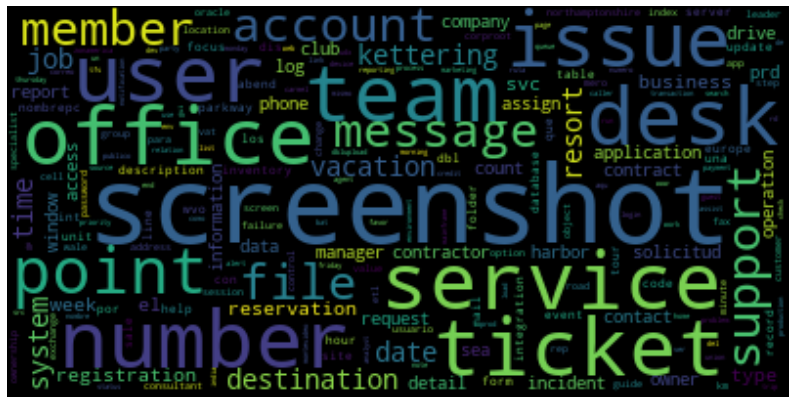

In [14]:
#show words collacations:
from wordcloud import WordCloud
most_common_words = " ".join(word[0] for word in most_common)

most_common_words_cloud= WordCloud(
    background_color='black',
    stopwords=most_common_words
)
# generate the word cloud
most_common_words_cloud.generate(most_common_words)

fig = plt.figure()
fig.set_figwidth(14) # set width
fig.set_figheight(18) # set height
# display the cloud
plt.imshow(most_common_words_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#### Word Cloud for most common words per assignment group

In [15]:
cleaned_descriptions = df_Tickets_cleaned['finalRemovingPOStags']

In [16]:
#Convert  Combined text from each sentense to the words. use of simple_process as it tokenize() internally
#https://radimrehurek.com/gensim/utils.html#gensim.utils.simple_preprocess
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations
data_words = list(sent_to_words(cleaned_descriptions))

Automatically detect common phrases – aka multi-word expressions, word n-gram collocations – from a stream of sentences.

In [17]:
# Build the bigram and trigram models
#https://radimrehurek.com/gensim/models/phrases.html
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=5) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [18]:
print(trigram_mod[bigram_mod[data_words[6000]]])

['vop_load_min_inform', 'incident', 'manager', 'oncall', 'web', 'team', 'member', 'alert', 'title_vop', 'load', 'alert', 'location_fservicesns_fnobody_fsearch', 'fsearches', 'load', 'view_result', 'splunk_administrator_splunk_engine', 'machine_data']


Lets view bigram model

In [19]:
print(bigram_mod[data_words[6000]])

['vop_load', 'min_inform', 'incident', 'manager', 'oncall', 'web', 'team', 'member', 'alert', 'title_vop', 'load', 'alert', 'location_fservicesns', 'fnobody_fsearch', 'fsearches', 'load', 'view_result', 'splunk_administrator', 'splunk_engine', 'machine_data']


In [20]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

In [21]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words)

In [22]:
print(data_words_bigrams[20000])


['afternoon', 'ticket', 'preview_myclubwyndham', 'ownership', 'ownership', 'detail', 'section', 'notice', 'contract', 'area', 'collapse', 'button', 'user', 'function', 'button', 'area', 'collapse', 'button', 'screenshot', 'jonathan_product', 'specialist_strategy', 'vacation_ownership', 'sea_harbor', 'dr_ph']


In [23]:
new_df = df_Tickets_cleaned.copy()
new_df['words'] = data_words_bigrams


In [24]:
new_df.head()

,Assignmentgroup,Description,Cleaned_Description,lemma_description,final_desription,finalRemovingPOStags,words
0,RCI APAC,Wallboard not working,wallboard not working,wallboard not working,wallboard not working,wallboard,[wallboard]
1,RCI APAC,Mapped drives missing,mapped drives missing,mapped drive missing,mapped drive missing,drive,[drive]
2,RCI APAC,Not able to login to Aspect,not able to login to aspect,not able to login to aspect,not able login aspect,login aspect,[login_aspect]
3,RCI APAC,LAN & EVS password reset - user was away for a...,lan and evs password reset user was away for m...,lan and ev password reset user wa away for month,lan ev password reset user wa away month,lan password reset user month,"[lan_password, reset, user, month]"
4,RCI APAC,not able to login to account,not able to login to account,not able to login to account,not able login account,login account,"[login, account]"


Create common method to generate word cloud

In [25]:
# Creating a function for wordcloud
def wordcloud_grp(f, x):
    wordclouds_0=' '.join(map(str, f))
    wc = WordCloud(width=480, height=480, max_font_size=20, min_font_size=10, max_words=50).generate(wordclouds_0)
    plt.figure(figsize=(20,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Most common 50 words of {}".format(x))
    plt.margins(x=0, y=0)
    plt.show()

In [26]:
#Sorting based on frequency of target class Assignment group
value = new_df['Assignmentgroup'].value_counts().sort_values(ascending=False).index
value

Index(['WVC Application L1 Support', 'RCI LATAM Uruguay Help Desk',
       'RCI Desktop EME', 'WVC DB Oracle Support',
       'RCI LATAM Mexico Service Desk', 'RCI Weeks App Support',
       'RCI Job Failure', 'WVC ETL L2 Support', 'RCI EME Service Desk',
       'RCI Call Center',
       ...
       'RCI Purchasing', 'WDN RCI Warranty November 2016 Savings Dollars RCI',
       'WDN RCI HFM FDM', 'RCI Decom', 'RCI B2C Tower',
       'WDN RCI LATAM Colombia Service Desk', 'WVC Program Mgmt',
       'RCIWTYAPRPROMO', 'WVC App Logging', 'WDN SSIO RCI'],
      dtype='object', length=150)

#### Word cloud for first 50 assignment group

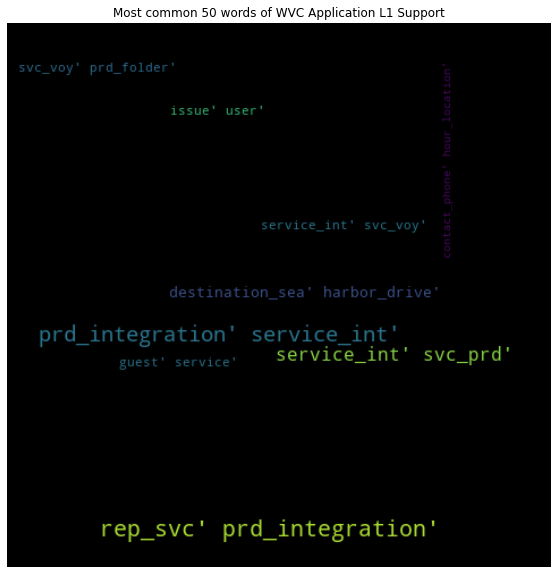

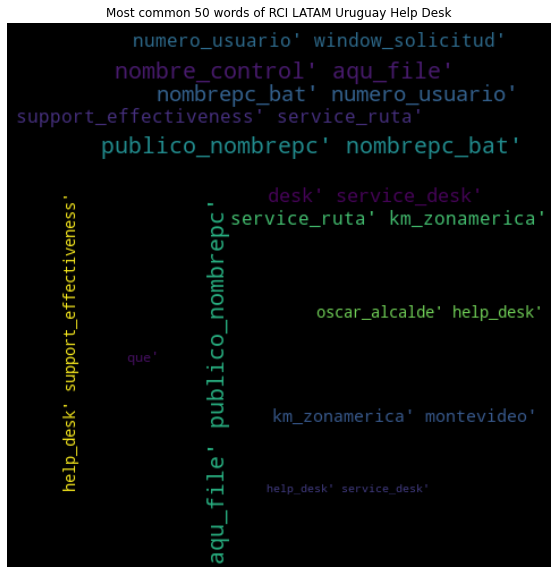

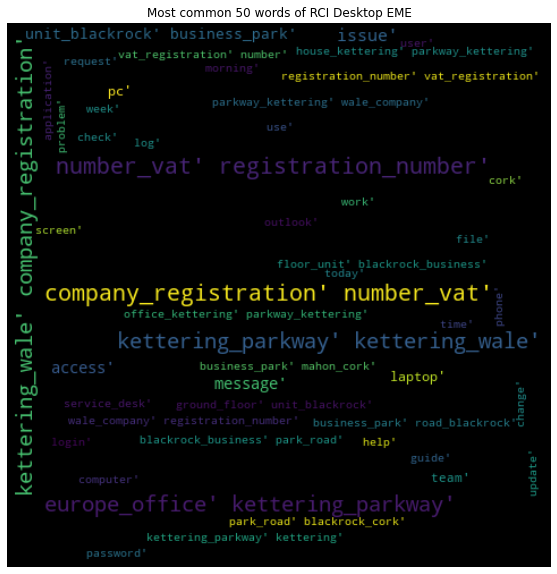

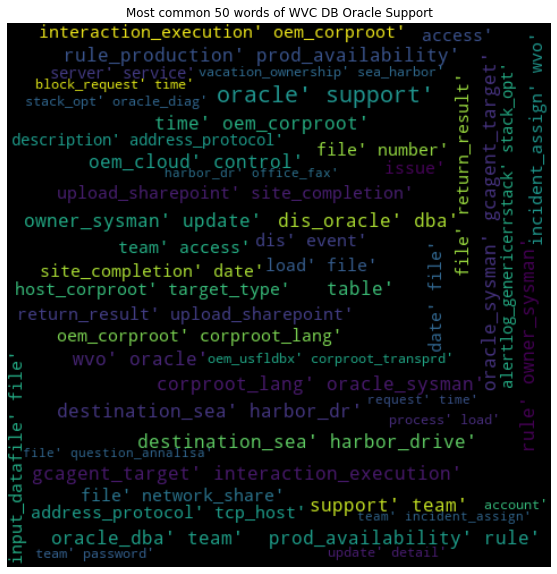

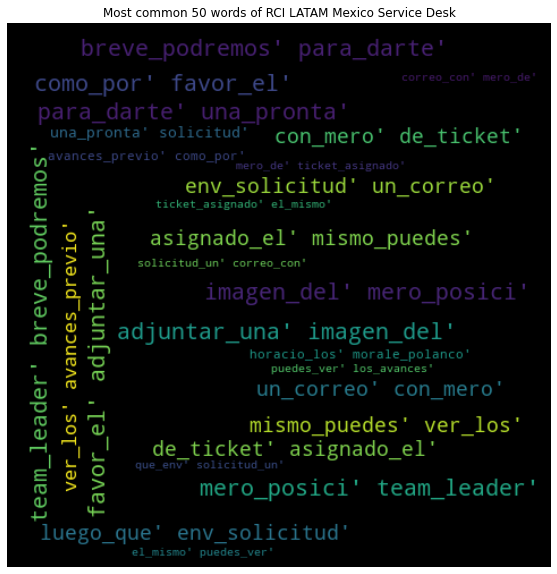

...

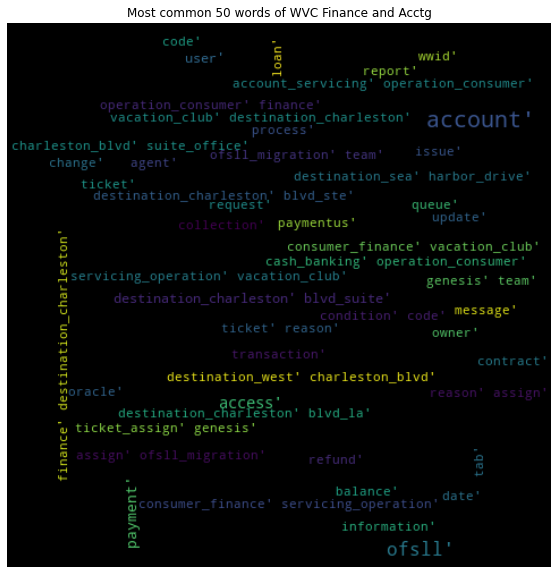

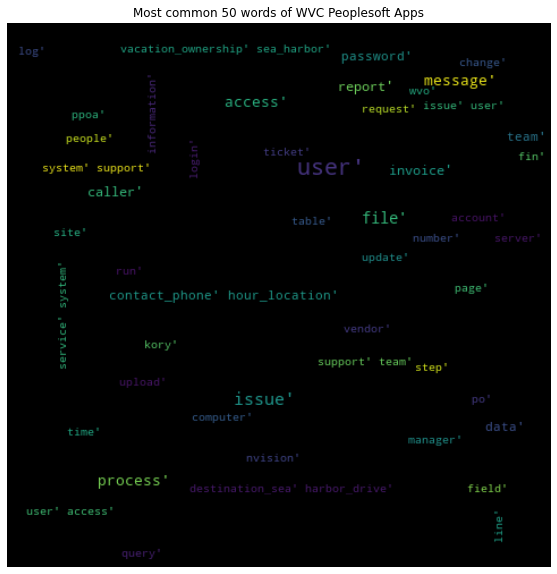

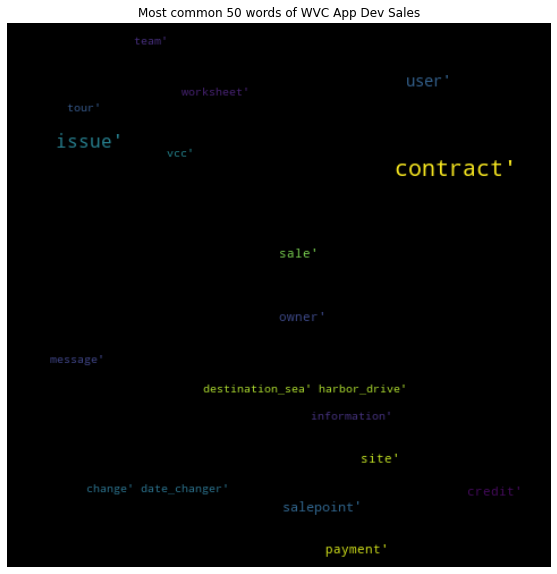

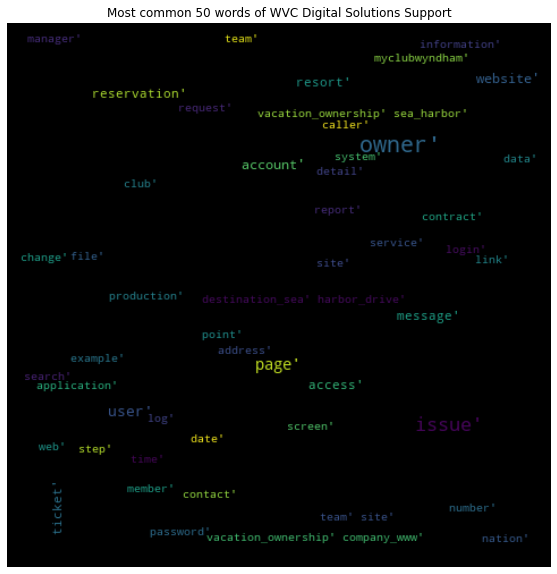

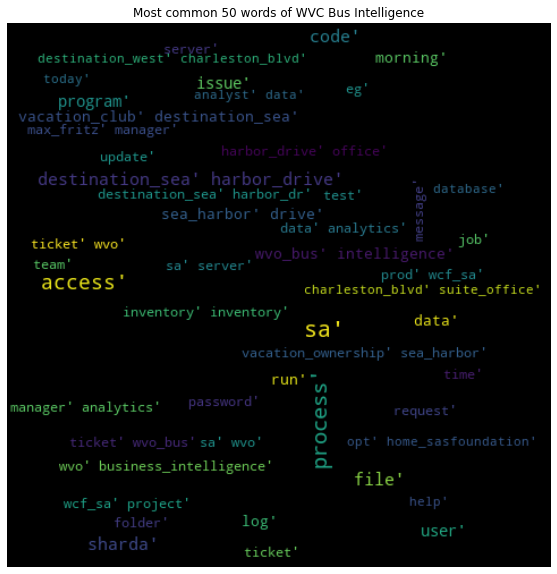

In [27]:
#for loop to pass the top 50 Assignment groups
for i in range(50):
    #print(new_df['Assignmentgroup'])
    Grp =  new_df[new_df['Assignmentgroup'] == value[i]]
    #print(Grp)
    Grp = Grp['words']
    wordcloud_grp(Grp,value[i])

#### Finding common words for each assignment group

In [28]:
# creating a new copy 
newdf_common = df_Tickets_cleaned.copy()
newdf_common['cleaned_descriptions'] = cleaned_descriptions

In [29]:
# dropping unnecessary column
drop_list = ["Assignmentgroup","cleaned_descriptions"]
newdf_common = newdf_common.drop(newdf_common.columns.difference(drop_list), axis=1)

In [30]:
newdf_common.head(5)

,Assignmentgroup,cleaned_descriptions
0,RCI APAC,wallboard
1,RCI APAC,drive
2,RCI APAC,login aspect
3,RCI APAC,lan password reset user month
4,RCI APAC,login account


In [31]:
#Group by assignment group and get unique group
newdf_common['cleaned_descriptions'] = newdf_common.groupby('Assignmentgroup')['cleaned_descriptions'].transform(lambda x : ' '.join(x))

In [32]:
newdf_common.tail(5)

,Assignmentgroup,cleaned_descriptions
235008,WVC Application L1 Support,user agent mymargaritavillevacationclub user a...
235009,WVC Application L1 Support,user agent mymargaritavillevacationclub user a...
235010,RCI Application Support L1,prd serv ind assign ticket wdn point reservati...
235011,WVC Fusion L2 Support,ticket assign sampath hemalatha june deshmukh ...
235012,WVC Infrastructure Middleware,user time cancellation note booking note time ...


In [33]:
# sorting assignment group
sorted = newdf_common.sort_values(['Assignmentgroup'], ascending = [True])

In [34]:
newdf_common_unique = sorted.groupby('Assignmentgroup').first().reset_index()

Unique group with cleaned description

In [35]:
newdf_common_unique.head(20)

,Assignmentgroup,cleaned_descriptions
0,RCI APAC,wallboard drive login aspect lan password rese...
1,RCI Affiliate Reporting,afternoon follow ticket news status leonardo r...
2,RCI Application Support L1,prd serv ind assign ticket wdn point reservati...
3,RCI Apps,lisa login people source oracle werinddbep u i...
4,RCI B2B,ticket assign support field group etp min max ...
5,RCI B2C,tab view vacation exchange fee discount guide ...
6,RCI B2C Tower,ticket screen salesforce enrollment instance m...
7,RCI Back Office,guy issue chris chris beveridge support analys...
8,RCI Brasil Service Desk,program bra hostname bra ip o window user avie...
9,RCI Brazil,para rio laptop rede configurar voice mail rio...


In [36]:
#get most common words,less common words:
def most_common_words(description):
    all_words = []
    if description==description:
        for word in description.split():
            all_words.append(word)
    freq_dest_words = nltk.FreqDist(all_words)
    #print('most common:')
    return freq_dest_words.most_common(50)
    #print(most_common)
    #print('\nhapaxes:')


In [37]:
newdf_common_unique['most_common_words'] =  newdf_common_unique['cleaned_descriptions'].apply(most_common_words)
#df_Tickets_new.iloc[:,[2,7]].head(20)  


In [38]:
newdf_common_unique.iloc[:,[0,2]].head(5)

,Assignmentgroup,most_common_words
0,RCI APAC,"[(team, 3947), (service, 2358), (singapore, 22..."
1,RCI Affiliate Reporting,"[(report, 347), (resort, 289), (user, 253), (i..."
2,RCI Application Support L1,"[(message, 954), (inventory, 840), (production..."
3,RCI Apps,"[(u, 9), (int, 8), (domain, 6), (werinddbep, 5..."
4,RCI B2B,"[(resort, 397), (vacation, 230), (ticket, 197)..."


Detailed assignment group and repective most common words

In [39]:
for i in range(100):
    print(newdf_common_unique['Assignmentgroup'][i],newdf_common_unique['most_common_words'][i])

RCI APAC [('team', 3947), ('service', 2358), ('singapore', 2270), ('road', 2091), ('member', 1993), ('toll', 1524), ('access', 1253), ('password', 1028), ('leader', 997), ('consultant', 897), ('qld', 882), ('issue', 834), ('user', 813), ('vacation', 765), ('operation', 711), ('varsity', 703), ('help', 639), ('message', 638), ('au', 625), ('job', 624), ('apac', 616), ('guide', 615), ('resort', 598), ('desk', 596), ('gui', 580), ('manager', 574), ('box', 550), ('system', 549), ('account', 538), ('login', 529), ('time', 528), ('tol', 527), ('support', 507), ('level', 483), ('file', 460), ('gcmc', 424), ('specialist', 397), ('log', 394), ('request', 387), ('lake', 384), ('office', 370), ('assist', 367), ('mail', 358), ('folder', 357), ('mountbatten', 355), ('wei', 355), ('tanya', 353), ('customer', 351), ('server', 341), ('parade', 335)]
RCI Affiliate Reporting [('report', 347), ('resort', 289), ('user', 253), ('issue', 183), ('affiliate', 154), ('reporting', 150), ('step', 132), ('service

#### Get frequent Bigram for each assignement group

In [40]:
#get frequent bigram

from nltk.util import bigrams
from nltk.lm.preprocessing import pad_both_ends

def check_bigram(text):
        #print(text)
        try:
            #bigrams=""
            #print(text)
            bigrams_list = list(bigrams(pad_both_ends(text.split(), n=2)))
            bigrams_freq_dest= nltk.FreqDist(bigrams_list)
            return bigrams_freq_dest.most_common(10)
        except:
            return ''
            #print("An exception occurred")
             #print(text)
   

In [41]:
newdf_common_unique['most_frequent_bigrams'] =  newdf_common_unique['cleaned_descriptions'].apply(check_bigram)

In [42]:
newdf_common_unique.iloc[:,[0,3]].head(5)

,Assignmentgroup,most_frequent_bigrams
0,RCI APAC,"[((road, singapore), 2066), ((member, service)..."
1,RCI Affiliate Reporting,"[((contact, phone), 57), ((arrival, report), 5..."
2,RCI Application Support L1,"[((trading, power), 479), ((message, mainframe..."
3,RCI Apps,"[((u, int), 8), ((werinddbep, u), 4), ((int, w..."
4,RCI B2B,"[((sylvan, way), 107), ((vacation, rental), 95..."


In [43]:
for i in range(100):
    print(newdf_common_unique['Assignmentgroup'][i],newdf_common_unique['most_frequent_bigrams'][i])

RCI APAC [(('road', 'singapore'), 2066), (('member', 'service'), 1415), (('team', 'leader'), 996), (('service', 'road'), 844), (('singapore', 'team'), 602), (('consultant', 'member'), 577), (('au', 'toll'), 573), (('vacation', 'consultant'), 553), (('leader', 'member'), 517), (('service', 'desk'), 486)]
RCI Affiliate Reporting [(('contact', 'phone'), 57), (('arrival', 'report'), 56), (('reporting', 'site'), 49), (('phone', 'hour'), 42), (('issue', 'user'), 38), (('hour', 'location'), 37), (('account', 'specialist'), 34), (('resort', 'link'), 34), (('unit', 'type'), 30), (('road', 'carmel'), 28)]
RCI Application Support L1 [(('trading', 'power'), 479), (('message', 'mainframe'), 461), (('mainframe', 'message'), 460), (('reason', 'date'), 457), (('date', 'restore'), 457), (('restore', 'trading'), 457), (('power', 'contact'), 456), (('contact', 'method'), 456), (('method', 'comment'), 455), (('production', 'message'), 448)]
RCI Apps [(('u', 'int'), 8), (('werinddbep', 'u'), 4), (('int', '

#### Get frequent Bigram for each assignement group

In [44]:
#get frequent bigram

from nltk.util import trigrams
from nltk.lm.preprocessing import pad_both_ends

def check_trigram(text):
        #print(text)
        try:
            #bigrams=""
            #print(text)
            bigrams_list = list(trigrams(pad_both_ends(text.split(), n=2)))
            bigrams_freq_dest= nltk.FreqDist(bigrams_list)
            return bigrams_freq_dest.most_common(10)
        except:
            return ''
            #print("An exception occurred")
             #print(text)

In [45]:
newdf_common_unique['most_frequent_trigrams'] =  newdf_common_unique['cleaned_descriptions'].apply(check_trigram)

In [46]:
for i in range(100):
    print(newdf_common_unique['Assignmentgroup'][i],newdf_common_unique['most_frequent_trigrams'][i])

RCI APAC [(('service', 'road', 'singapore'), 844), (('member', 'service', 'road'), 840), (('road', 'singapore', 'team'), 581), (('consultant', 'member', 'service'), 576), (('team', 'leader', 'member'), 517), (('leader', 'member', 'service'), 517), (('vacation', 'consultant', 'member'), 442), (('box', 'gcmc', 'qld'), 424), (('apac', 'service', 'desk'), 398), (('varsity', 'lake', 'qld'), 346)]
RCI Affiliate Reporting [(('contact', 'phone', 'hour'), 39), (('phone', 'hour', 'location'), 31), (('los', 'morale', 'polanco'), 25), (('horacio', 'los', 'morale'), 23), (('kettering', 'parkway', 'kettering'), 22), (('wdn', 'affiliate', 'rd'), 22), (('affiliate', 'rd', 'party'), 22), (('week', 'arrival', 'report'), 20), (('location', 'wdn', 'affiliate'), 20), (('north', 'road', 'carmel'), 19)]
RCI Application Support L1 [(('message', 'mainframe', 'message'), 460), (('reason', 'date', 'restore'), 457), (('date', 'restore', 'trading'), 457), (('restore', 'trading', 'power'), 457), (('trading', 'power

In [47]:
df_Tickets_cleaned.shape

(234908, 6)

In [48]:
df_Tickets_cleaned['num_words'] = df_Tickets_cleaned.Cleaned_Description.apply(lambda x : x if x!=x else len(x.split()))

In [49]:
bins=[0,50,75, np.inf]
df_Tickets_cleaned['bins']=pd.cut(df_Tickets_cleaned.num_words, bins=[0,100,300,500,800, np.inf], labels=['0-100', '100-300', '300-500','500-800' ,'>800'])

In [50]:
word_distribution = df_Tickets_cleaned.groupby('bins').size().reset_index().rename(columns={0:'counts'})

In [51]:
word_distribution.head()

,bins,counts
0,0-100,187201
1,100-300,35916
2,300-500,5461
3,500-800,1122
4,>800,824


Text(0.5, 1.0, 'Word distribution per bin')

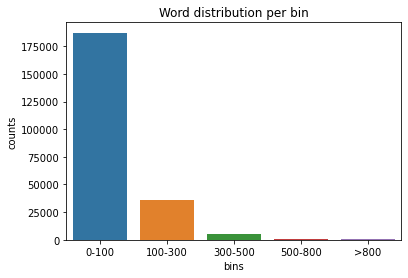

In [52]:
sns.barplot(x='bins', y='counts', data=word_distribution).set_title("Word distribution per bin")

Observation

    Most of the descrption of the problems raised by callers are short with in 0-100 words
    Few items are with bit descriptive

In [53]:
group = df_Tickets_cleaned['Assignmentgroup'].value_counts(dropna=False).keys().tolist()
counts = df_Tickets_cleaned['Assignmentgroup'].value_counts(dropna=False).tolist()
value_dict = dict(zip(group, counts))

In [54]:
print(value_dict)

{'WVC Application L1 Support': 28511, 'RCI LATAM Uruguay Help Desk': 23110, 'RCI Desktop EME': 16931, 'WVC DB Oracle Support': 11539, 'RCI LATAM Mexico Service Desk': 11029, 'RCI Weeks App Support': 9293, 'RCI Job Failure': 7609, 'WVC ETL L2 Support': 7345, 'RCI EME Service Desk': 6458, 'RCI Call Center': 5994, 'RCI Points Spt': 5728, 'WVC Sales Marketing L2 Support': 5629, 'RCI APAC': 5405, 'RCI EME Solutions Delivery': 4814, 'RCI Business Intelligence': 4252, 'WVC DeepBlue Vendor': 4234, 'RCI B2C': 4162, 'RCI LATAM Uruguay Service Desk': 4000, 'RCI India Service Desk': 3706, 'WVC App Svcs Sales Mktg': 3541, 'WVC App Svcs Mainframe Apps': 3092, 'WVC Voyager': 3044, 'RCI Back Office': 2889, 'RCI Brazil': 2816, 'WVC Infrastructure Middleware': 2809, 'WVC Voyager L2 Support': 2715, 'WVC App Svcs Resorts': 2600, 'WVC App Svcs Reservations': 2579, 'WVC Focus L2 Support': 2510, 'WVC Fusion L2 Support': 2105, 'WVC Salesforce Admin': 2048, 'RCI LATAM Desktop': 2036, 'RCI EMEA Network': 1923, 

In [55]:
# Create the Dataset for classifying groups
df_Tickets_final = df_Tickets_cleaned.copy()
df_Tickets_final['Assignmentgroup']=df_Tickets_final['Assignmentgroup'].apply(lambda x : 'Restgroup' if  value_dict.get(x) < 1000 else x)

In [56]:
group = df_Tickets_final['Assignmentgroup'].value_counts(dropna=False).keys().tolist()
counts = df_Tickets_final['Assignmentgroup'].value_counts(dropna=False).tolist()
test = dict(zip(group, counts))

In [57]:
print(test)

{'WVC Application L1 Support': 28511, 'RCI LATAM Uruguay Help Desk': 23110, 'RCI Desktop EME': 16931, 'Restgroup': 12596, 'WVC DB Oracle Support': 11539, 'RCI LATAM Mexico Service Desk': 11029, 'RCI Weeks App Support': 9293, 'RCI Job Failure': 7609, 'WVC ETL L2 Support': 7345, 'RCI EME Service Desk': 6458, 'RCI Call Center': 5994, 'RCI Points Spt': 5728, 'WVC Sales Marketing L2 Support': 5629, 'RCI APAC': 5405, 'RCI EME Solutions Delivery': 4814, 'RCI Business Intelligence': 4252, 'WVC DeepBlue Vendor': 4234, 'RCI B2C': 4162, 'RCI LATAM Uruguay Service Desk': 4000, 'RCI India Service Desk': 3706, 'WVC App Svcs Sales Mktg': 3541, 'WVC App Svcs Mainframe Apps': 3092, 'WVC Voyager': 3044, 'RCI Back Office': 2889, 'RCI Brazil': 2816, 'WVC Infrastructure Middleware': 2809, 'WVC Voyager L2 Support': 2715, 'WVC App Svcs Resorts': 2600, 'WVC App Svcs Reservations': 2579, 'WVC Focus L2 Support': 2510, 'WVC Fusion L2 Support': 2105, 'WVC Salesforce Admin': 2048, 'RCI LATAM Desktop': 2036, 'RCI E

In [58]:
df_Tickets_final.tail()

,Assignmentgroup,Description,Cleaned_Description,lemma_description,final_desription,finalRemovingPOStags,num_words,bins
235008,WVC Application L1 Support,"Informatica failures, Long runnings, unschedul...",informatica failures long runnings unscheduled...,informatica failure long running unscheduled w...,informatica failure long running unscheduled ...,failure batch status update need need sla,21,0-100
235009,WVC Application L1 Support,"Informatica failures, Long runnings, unschedul...",informatica failures long runnings unscheduled...,informatica failure long running unscheduled w...,informatica failure long running unscheduled ...,failure batch status update need need sla,21,0-100
235010,RCI Application Support L1,"Somasundharm, Sabarinathan\nTue 11/16/2021 4:3...",somasundharm sabarinathan tue am hi prabu base...,somasundharm sabarinathan tue am hi prabu base...,somasundharm sabarinathan tue prabu baseline ...,somasundharm sabarinathan tue baseline job nov...,52,0-100
235011,WVC Fusion L2 Support,Reprocessing Legacy Contact Error queue messag...,reprocessing legacy contact error queue messag...,reprocessing legacy contact error queue messag...,reprocessing legacy contact error queue messa...,legacy contact queue message address sync cs,12,0-100
235012,WVC Infrastructure Middleware,"Hi Team,\n\nPlease restart RES ODM Tomcat Test...",hi team please restart res odm tomcat test hi ...,hi team please restart re odm tomcat test hi s...,team restart odm tomcat test sd create incide...,team odm tomcat test incident assign wvc infra...,22,0-100


In [4]:
%time df_Tickets_final = pd.read_parquet('D:/datascience/support_ticket_classification/ticket.parquet',engine='fastparquet')

Wall time: 2.04 s


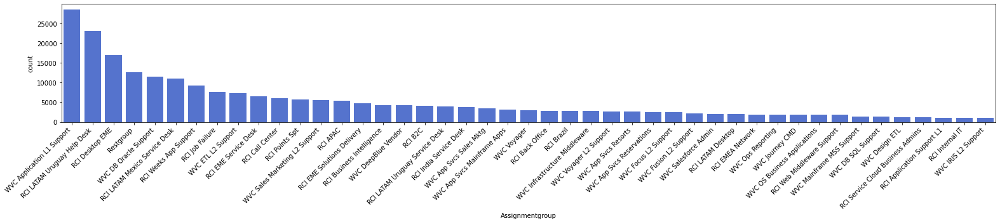

In [5]:
#Create Dataset for 'others' i.e all groups which is not part of GRP_0
#itTicketOthersDF = itTicketDF[itTicketDF['Assignment group'] != 'GRP_0']

descending_order = df_Tickets_final['Assignmentgroup'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#add code to rotate the labels
ax=sns.countplot(x='Assignmentgroup', data=df_Tickets_final, color='royalblue',order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

Observation :
    
    1. Highly imbalanced data
    2. WVC Application L1 Support to be highest
    3. WVC IRIS L2 Support to be lowest

#### Treat the imbalnce in the 'other' dataset by resampling

In [6]:
maxOthers = df_Tickets_final['Assignmentgroup'].value_counts().max()
maxOthers

28511

In [7]:
from sklearn.utils import resample
df_Tickets_final_resampled = df_Tickets_final[0:0]
for grp in df_Tickets_final['Assignmentgroup'].unique():
    itTicketGrpDF = df_Tickets_final[df_Tickets_final['Assignmentgroup'] == grp]
    resampled = resample(itTicketGrpDF, replace=True, n_samples=int(maxOthers/2), random_state=123)
    df_Tickets_final_resampled = df_Tickets_final_resampled.append(resampled)

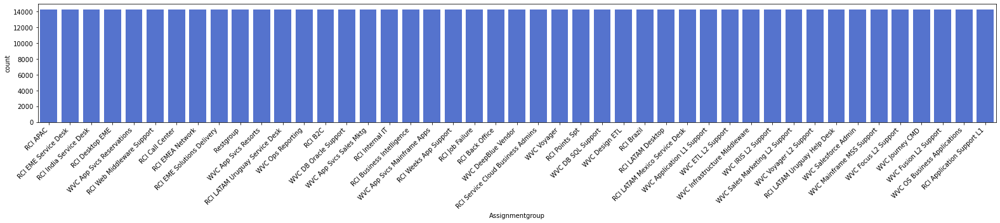

In [8]:
descending_order = df_Tickets_final_resampled['Assignmentgroup'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#add code to rotate the labels
ax=sns.countplot(x='Assignmentgroup', data=df_Tickets_final_resampled, color='royalblue')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

### Train test split

Separating target column and description feature column

In [17]:
labelData = df_Tickets_final_resampled['Assignmentgroup']
data = df_Tickets_final_resampled['finalRemovingPOStags']

In [18]:
# Count vectorizer
if remove_stop_words:
    count_vect = CountVectorizer(max_df=0.90, min_df=2,stop_words=stop_words_lang)
elif use_stemming:
    count_vect = StemmedCountVectorizer(stop_words=stop_words_lang)
else:
    count_vect = CountVectorizer()

In [19]:
#vectorized_data = count_vect.fit_transform(df_Tickets_final_resampled['finalRemovingPOStags'])

In [20]:
# Split dataset into training and testing data
#train_data, test_data, y_train, y_test = train_test_split(
#    data, labelData, test_size=0.50, random_state=42
#)  # split data to train/test sets with 80:20 ratio

In [21]:
X_train, test_data, y_train, y_test = train_test_split(
    data, labelData, test_size=0.2, random_state=123)
train_data,val_data,y_train,y_val = train_test_split(
    X_train, y_train, test_size=0.25, random_state=2)

In [22]:
train_data.shape

(384885,)

In [23]:
test_data.shape

(128295,)

In [24]:
val_data.shape

(128295,)

### Word2VEC

tokenized_description = dfTickets['tidy_description'].apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_description,
            window=5, # context window size
            min_count=2,
            sg = 1, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_description, total_examples= len(dfTickets['tidy_description']), epochs=20)

### Creating pipeline of different models 

We are using count vectorizer and Tfidftransformer for converting text into machine learning code

In [25]:
### Now let us contruct some pipelines of our choice.

pipe_lr = Pipeline([('vect', count_vect),
                   ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(random_state=42))],verbose = True)

pipe_nb = Pipeline([('vect', count_vect),
                 ('tfidf', TfidfTransformer()),
                 ('model',  MultinomialNB(fit_prior=fit_prior))],verbose = True)

pipe_xgb = Pipeline([('vect', count_vect),
                   ('tfidf', TfidfTransformer()),
            ('clf', XGBClassifier(
            max_depth=2, random_state=0))],verbose = True)


pipe_sgd = Pipeline([('vect', count_vect),
                   ('tfidf', TfidfTransformer()),
            ('clf', SGDClassifier(
            loss='hinge', penalty='l2', alpha=1e-3,
            n_iter_no_change=5, random_state=42))],verbose = True)

In [26]:
### Running the pipeline without hyperparameter tunnning

# List of pipelines for iterating through each of them
piplines = [pipe_lr,pipe_nb,pipe_xgb,pipe_sgd]
# Creating a dict for our reference
model_dict = {0: 'Logistic Regression', 
        1: 'Multinomial NaiveBayes',
        2: 'XGB',
        3:  'SGD Classifier'}

In [19]:
# Model fitting and train evaluation 

for idx, gs in enumerate(piplines):
    print('\nEstimator: %s' % model_dict[idx])
    gs.fit(train_data, y_train)
    #print('Best params are : %s' % gs.get_params())
    # Best training data accuracy
    #print('Training accuracy: %.3f' % gs.best_score_)
    print("validating model")
     # Score and evaluate model on test data using model without hyperparameter tuning
    predicted = gs.predict(val_data)
    prediction_acc = np.mean(predicted == val_data)
    print("Validation -- > Confusion matrix without GridSearch:")
    print(metrics.confusion_matrix(y_val, predicted))
    print("Validation Accuracy without GridSearch: " + str(prediction_acc))
    print('Validation Precision: %.3f' % precision_score(y_val, predicted,average='micro'))
    print('Validation Recall: %.3f' % recall_score(y_val, predicted,average='micro'))
    print('Validation F1 Score: %.3f' % f1_score(y_val, predicted,average='micro'))
    # Score and evaluate model on test data using model without hyperparameter tuning
    predicted = gs.predict(test_data)
    prediction_acc = np.mean(predicted == y_test)
    print("Test -- > Confusion matrix without GridSearch:")
    print(metrics.confusion_matrix(y_test, predicted))
    print("Test Accuracy without GridSearch: " + str(prediction_acc))
    print('Test Precision: %.3f' % precision_score(y_test, predicted,average='micro'))
    print('Test Recall: %.3f' % recall_score(y_test, predicted,average='micro'))
    print('Test F1 Score: %.3f' % f1_score(y_test, predicted,average='micro'))


Estimator: Logistic Regression
[Pipeline] .............. (step 1 of 3) Processing vect, total=   6.6s
[Pipeline] ............. (step 2 of 3) Processing tfidf, total=   0.4s


C:\Users\ashis\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Pipeline] ............... (step 3 of 3) Processing clf, total= 2.1min
validating model
Validation -- > Confusion matrix without GridSearch:
[[2183    1   13 ...    1    1    0]
 [   0 2556    0 ...    0    0    0]
 [  38    1 2343 ...    2    1    1]
 ...
 [   5    0    1 ... 2409    1    4]
 [   5    0   11 ...    5 2395  152]
 [   3    1    6 ...    0  105 2409]]
Validation Accuracy without GridSearch: 0.0
Validation Precision: 0.848
Validation Recall: 0.848
Validation F1 Score: 0.848
Test -- > Confusion matrix without GridSearch:
[[2205    1   15 ...    3    2    0]
 [   0 2515    0 ...    0    0    0]
 [  22    1 2349 ...    7    2    1]
 ...
 [   7    0    2 ... 2283    1    1]
 [   2    0    7 ...    2 2333  167]
 [   7    1   10 ...    0   87 2486]]
Test Accuracy without GridSearch: 0.8460267352585837
Test Precision: 0.846
Test Recall: 0.846
Test F1 Score: 0.846

Estimator: Multinomial NaiveBayes
[Pipeline] .............. (step 1 of 3) Processing vect, total=   6.6s
[Pipeline] 

Observations

    1. Logistic Regression and Naive Bayes has performed well.
    2. XGBoost has been a slow performer with 46.9 min . In addition accuracy is also low.
    3. We have tried SGDClassifier also but overall accuracy score is not so high.

In [20]:
for idx, gs in enumerate(piplines):
    if model_dict[idx]=='Logistic Regression' or model_dict[idx]=='Multinomial NaiveBayes':
        print('\nEstimator: %s' % model_dict[idx])
        predicted = gs.predict(test_data)
        print(classification_report(y_test,predicted))


Estimator: Logistic Regression
                                   precision    recall  f1-score   support

                         RCI APAC       0.81      0.77      0.79      2874
       RCI Application Support L1       0.90      0.88      0.89      2848
                          RCI B2C       0.81      0.82      0.81      2879
                  RCI Back Office       0.80      0.74      0.77      2812
                       RCI Brazil       0.78      0.86      0.82      2838
        RCI Business Intelligence       0.97      0.96      0.97      2888
                  RCI Call Center       0.74      0.61      0.67      2731
                  RCI Desktop EME       0.62      0.56      0.59      2826
             RCI EME Service Desk       0.65      0.69      0.67      2929
       RCI EME Solutions Delivery       0.96      0.96      0.96      2817
                 RCI EMEA Network       0.85      0.90      0.87      2851
           RCI India Service Desk       0.79      0.78      0.78   

#### Using TDIDF Vectorizer and Feature decomposition 

In [27]:
td_idf_vect = TfidfVectorizer(max_df=0.90, min_df=2, max_features=6000)
#svd = TruncatedSVD(n_components=500, n_iter=10, random_state=42)

In [19]:
### Now let us contruct some pipelines of our choice.

pipe_tv_lr = Pipeline([('td_idf_vect',td_idf_vect),
                ('clf', LogisticRegression(random_state=42))],verbose = True)

pipe_tv_nb = Pipeline([('td_idf_vect',td_idf_vect),
                 ('model',  MultinomialNB(fit_prior=fit_prior))],verbose = True)

pipe_tv_xgb = Pipeline([('td_idf_vect',td_idf_vect),
            ('clf', XGBClassifier(
            max_depth=2, random_state=0))],verbose = True)


pipe_tv_sgd = Pipeline([('td_idf_vect',td_idf_vect),
            ('clf', SGDClassifier(
            loss='hinge', penalty='l2', alpha=1e-3,
            n_iter_no_change=10, random_state=42))],verbose = True)

In [20]:
### Running the pipeline without hyperparameter tunnning

# List of pipelines for iterating through each of them
piplines_td_idf = [pipe_tv_lr,pipe_nb,pipe_xgb,pipe_sgd]
# Creating a dict for our reference
model_dict = {0: 'Logistic Regression', 
        1: 'Multinomial NaiveBayes',
        2: 'XGB',
        3:  'SGD Classifier'}

In [29]:
# Model fitting and train evaluation 

for idx, gs in enumerate(piplines):
    print('\nEstimator: %s' % model_dict[idx])
    gs.fit(train_data, y_train)
    #print('Best params are : %s' % gs.get_params())
    # Best training data accuracy
    #print('Training accuracy: %.3f' % gs.best_score_)
    print("validating model")
     # Score and evaluate model on test data using model without hyperparameter tuning
    predicted = gs.predict(val_data)
    prediction_acc = np.mean(predicted == val_data)
    print("Validation -- > Confusion matrix without GridSearch:")
    print(metrics.confusion_matrix(y_val, predicted))
    print("Validation Accuracy without GridSearch: " + str(prediction_acc))
    print('Validation Precision: %.3f' % precision_score(y_val, predicted,average='micro'))
    print('Validation Recall: %.3f' % recall_score(y_val, predicted,average='micro'))
    print('Validation F1 Score: %.3f' % f1_score(y_val, predicted,average='micro'))
    # Score and evaluate model on test data using model without hyperparameter tuning
    predicted = gs.predict(test_data)
    prediction_acc = np.mean(predicted == y_test)
    print("Test -- > Confusion matrix without GridSearch:")
    print(metrics.confusion_matrix(y_test, predicted))
    print("Test Accuracy without GridSearch: " + str(prediction_acc))
    print('Test Precision: %.3f' % precision_score(y_test, predicted,average='micro'))
    print('Test Recall: %.3f' % recall_score(y_test, predicted,average='micro'))
    print('Test F1 Score: %.3f' % f1_score(y_test, predicted,average='micro'))


Estimator: Logistic Regression
[Pipeline] .............. (step 1 of 3) Processing vect, total=   6.8s
[Pipeline] ............. (step 2 of 3) Processing tfidf, total=   0.4s


C:\Users\ashis\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Pipeline] ............... (step 3 of 3) Processing clf, total= 2.2min
validating model
Validation -- > Confusion matrix without GridSearch:
[[2183    1   13 ...    1    1    0]
 [   0 2556    0 ...    0    0    0]
 [  38    1 2343 ...    2    1    1]
 ...
 [   5    0    1 ... 2409    1    4]
 [   5    0   11 ...    5 2395  152]
 [   3    1    6 ...    0  105 2409]]
Validation Accuracy without GridSearch: 0.0
Validation Precision: 0.848
Validation Recall: 0.848
Validation F1 Score: 0.848
Test -- > Confusion matrix without GridSearch:
[[2205    1   15 ...    3    2    0]
 [   0 2515    0 ...    0    0    0]
 [  22    1 2349 ...    7    2    1]
 ...
 [   7    0    2 ... 2283    1    1]
 [   2    0    7 ...    2 2333  167]
 [   7    1   10 ...    0   87 2486]]
Test Accuracy without GridSearch: 0.8460267352585837
Test Precision: 0.846
Test Recall: 0.846
Test F1 Score: 0.846

Estimator: Multinomial NaiveBayes
[Pipeline] .............. (step 1 of 3) Processing vect, total=   6.7s
[Pipeline] 

In [30]:
for idx, gs in enumerate(piplines):
    if model_dict[idx]=='Logistic Regression' or model_dict[idx]=='Multinomial NaiveBayes':
        print('\nEstimator: %s' % model_dict[idx])
        predicted = gs.predict(test_data)
        print(classification_report(y_test,predicted))


Estimator: Logistic Regression
                                   precision    recall  f1-score   support

                         RCI APAC       0.81      0.77      0.79      2874
       RCI Application Support L1       0.90      0.88      0.89      2848
                          RCI B2C       0.81      0.82      0.81      2879
                  RCI Back Office       0.80      0.74      0.77      2812
                       RCI Brazil       0.78      0.86      0.82      2838
        RCI Business Intelligence       0.97      0.96      0.97      2888
                  RCI Call Center       0.74      0.61      0.67      2731
                  RCI Desktop EME       0.62      0.56      0.59      2826
             RCI EME Service Desk       0.65      0.69      0.67      2929
       RCI EME Solutions Delivery       0.96      0.96      0.96      2817
                 RCI EMEA Network       0.85      0.90      0.87      2851
           RCI India Service Desk       0.79      0.78      0.78   

### Creating pipeline of different models

TDIDFVectorizer

In [28]:
# Construct params

param_range_fl = [1.0, 0.5, 0.1]

# Logistic parameters
grid_params_lr = [{'clf__penalty': ['l1', 'l2'],
        'clf__C': param_range_fl,
        'clf__solver': ['liblinear']}] 

# NB parameters
grid_params_nb = {
   'vect__ngram_range': [(1,1), (1,2),(2,2)],
   'tfidf__use_idf': (True, False),
   'model__alpha': (1e-2, 1e-3)
}

# SGD parameters
grid_params_sgd = {
    "clf__loss" : ["hinge", "log", "squared_hinge"],
    "clf__alpha" : [0.0001, 0.001, 0.01, 0.1],
    "clf__penalty" : ["l2", "l1", "none"],
}

# XGB parameters
grid_params_xgb = {
    'clf__max_depth': range (2, 10, 1),
    'clf__n_estimators': range(60, 220, 40),
    'clf__learning_rate': [0.1, 0.01, 0.05]
}



# Construct grid search 
jobs = -1

gslr = GridSearchCV(estimator=pipe_lr,
            param_grid=grid_params_lr,
            scoring='accuracy',
            cv=5,
            n_jobs=jobs,verbose=True) 

gsnb = GridSearchCV(estimator=pipe_nb,
            param_grid=grid_params_nb,
            scoring='accuracy',
            cv=5, 
            n_jobs=jobs,verbose=True)

#gsxgb = GridSearchCV(estimator=pipe_xgb,
#           param_grid=grid_params_xgb,
#            scoring='accuracy',
#            cv=5,
#            n_jobs=jobs,verbose=True)

#gssgd = GridSearchCV(estimator=pipe_sgd,
#            param_grid=grid_params_sgd,
#            scoring='accuracy',
#            cv=5,
#            n_jobs=jobs,verbose=True)



### Hyper Parameter Tuning 

Considering Logistic Regression and Naive Bayes has better performance without hyperparameter tuning in terms of 
accuracy we will execute hyperparameter tuning techniques to 
achieve the best score for these two algos.

In [29]:
### Running the pipeline without hyperparameter tunnning
# List of pipelines for iterating through each of them
gs_pipelines = [gsnb]

In [31]:
# Model fitting and train evaluation 

#for idx, gs in enumerate(gs_pipelines):
    print('\nEstimator: %s' % model_dict[idx])
    #print(gs.get_params().keys())
    gsnb.fit(train_data, y_train)
    #print('Best params are : %s' % gs.get_params())
    # Best training data accuracy
    #print('Training accuracy: %.3f' % gs.best_score_)
    print("Evaluating model")
    # Score and evaluate model on test data using model without hyperparameter tuning
    predicted = gsnb.predict(test_data)
    prediction_acc = np.mean(predicted == y_test)
    print("Confusion matrix with GridSearch:")
    print(metrics.confusion_matrix(y_test, predicted))
    print("Test Accuracy with GridSearch: " + str(prediction_acc))
    print('Precision: %.3f' % precision_score(y_test, predicted,average='micro'))
    print('Recall: %.3f' % recall_score(y_test, predicted,average='micro'))
    print('F1 Score: %.3f' % f1_score(y_test, predicted,average='micro'))
    gsnb.best_estimator_


Estimator: Logistic Regression
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[Pipeline] .............. (step 1 of 3) Processing vect, total=  15.7s
[Pipeline] ............. (step 2 of 3) Processing tfidf, total=   1.1s
[Pipeline] ............. (step 3 of 3) Processing model, total=   2.5s
Evaluating model
Confusion matrix with GridSearch:
[[2398    2   12 ...   40    4    2]
 [   0 1878    0 ...    4    0    0]
 [   7    0 2728 ...   28    3    0]
 ...
 [   0    0    0 ... 2629    0    6]
 [   0    0    0 ...    6 2639   80]
 [   0    0    1 ...    0   19 2758]]
Test Accuracy with GridSearch: 0.9023656416851787
Precision: 0.902
Recall: 0.902
F1 Score: 0.902


In [32]:
gsnb.best_estimator_

Pipeline(steps=[('vect', CountVectorizer(ngram_range=(1, 2))),
                ('tfidf', TfidfTransformer()),
                ('model', MultinomialNB(alpha=0.001))],
         verbose=True)

In [33]:
gsnb.best_estimator_

Pipeline(steps=[('vect', CountVectorizer(ngram_range=(1, 2))),
                ('tfidf', TfidfTransformer()),
                ('model', MultinomialNB(alpha=0.001))],
         verbose=True)

In [37]:
# import joblib
from joblib import dump
# dump the pipeline model
dump(gsnb, filename="D:/datascience/support_ticket_classification/ticket_assignement_group.joblib")

['D:/datascience/support_ticket_classification/ticket_assignement_group.joblib']

In [4]:
from joblib import load
pipeline = load("D:/datascience/support_ticket_classification/ticket_assignement_group.joblib")

In [5]:
pipeline

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('vect', CountVectorizer()),
                                       ('tfidf', TfidfTransformer()),
                                       ('model', MultinomialNB())],
                                verbose=True),
             n_jobs=-1,
             param_grid={'model__alpha': (0.01, 0.001),
                         'tfidf__use_idf': (True, False),
                         'vect__ngram_range': [(1, 1), (1, 2), (2, 2)]},
             scoring='accuracy', verbose=True)

In [8]:
issue = ["My printer is not working "]
x = pipeline.predict(issue)
print(x)

['RCI India Service Desk']


### LightGBM 

LightGBM is a gradient boosting framework that uses tree based learning algorithms. It is designed to be distributed and efficient with the following advantages:

    Faster training speed and higher efficiency.
    Lower memory usage.
    Better accuracy.
    Support of parallel, distributed, and GPU learning.
    Capable of handling large-scale data.

In [19]:
import lightgbm as lgb

In [20]:
lgb_model = lgb.LGBMClassifier()

In [21]:
### Now let us contruct some pipelines of our choice.
pipe_lgbm = Pipeline([('vect', count_vect),
                   ('tfidf', TfidfTransformer()),
                   ('clf',lgb_model)],verbose = True)

In [40]:
gs = pipe_lgbm
gs.fit(train_data, y_train)
#print('Best params are : %s' % gs.get_params())
# Best training data accuracy
#print('Training accuracy: %.3f' % gs.best_score_)
print("validating model")
 # Score and evaluate model on test data using model without hyperparameter tuning
predicted = gs.predict(val_data)
prediction_acc = np.mean(predicted == val_data)
print("Validation -- > Confusion matrix without GridSearch:")
print(metrics.confusion_matrix(y_val, predicted))
print("Validation Accuracy without GridSearch: " + str(prediction_acc))
print('Validation Precision: %.3f' % precision_score(y_val, predicted,average='micro'))
print('Validation Recall: %.3f' % recall_score(y_val, predicted,average='micro'))
print('Validation F1 Score: %.3f' % f1_score(y_val, predicted,average='micro'))
# Score and evaluate model on test data using model without hyperparameter tuning
predicted = gs.predict(test_data)
prediction_acc = np.mean(predicted == y_test)
print("Test -- > Confusion matrix without GridSearch:")
print(metrics.confusion_matrix(y_test, predicted))
print("Test Accuracy without GridSearch: " + str(prediction_acc))
print('Test Precision: %.3f' % precision_score(y_test, predicted,average='micro'))
print('Test Recall: %.3f' % recall_score(y_test, predicted,average='micro'))
print('Test F1 Score: %.3f' % f1_score(y_test, predicted,average='micro'))

[Pipeline] .............. (step 1 of 3) Processing vect, total=   6.7s
[Pipeline] ............. (step 2 of 3) Processing tfidf, total=   0.4s
[Pipeline] ............... (step 3 of 3) Processing clf, total=13.1min
validating model
Validation -- > Confusion matrix without GridSearch:
[[2061    7   20 ...    6    5    3]
 [   0 2615    5 ...    1    0    0]
 [  21   11 2081 ...   17    8    6]
 ...
 [  12    7    5 ... 2359    3    6]
 [   1    0   15 ...   13 2261   92]
 [   3    0   20 ...   15   56 2389]]
Validation Accuracy without GridSearch: 0.0
Validation Precision: 0.809
Validation Recall: 0.809
Validation F1 Score: 0.809
Test -- > Confusion matrix without GridSearch:
[[2047   11   20 ...    4    6    2]
 [   0 2527    3 ...    2    0    0]
 [  22   12 2091 ...   13    7   11]
 ...
 [   4    5    5 ... 2284    5    3]
 [   1    0   14 ...    5 2237   94]
 [   7    0   14 ...   13   63 2457]]
Test Accuracy without GridSearch: 0.8080049885030594
Test Precision: 0.808
Test Recall: 0.

In [22]:
rs_parameters = {
    'clf__learning_rate': [0.1,0.2,0.3],
    'clf__n_estimators': [100,120],
    'clf__num_leaves': [32,48]
}

In [23]:
grid_imba = GridSearchCV(pipe_lgbm,
                         param_grid=rs_parameters,
                         cv=5,
                         scoring='accuracy',
                         n_jobs=-1,
                         verbose=True
                        )

In [ ]:
gs = grid_imba
gs.fit(train_data, y_train)
#print('Best params are : %s' % gs.get_params())
# Best training data accuracy
#print('Training accuracy: %.3f' % gs.best_score_)
print("validating model")
 # Score and evaluate model on test data using model without hyperparameter tuning
predicted = gs.predict(val_data)
prediction_acc = np.mean(predicted == val_data)
print("Validation -- > Confusion matrix with  GridSearch:")
print(metrics.confusion_matrix(y_val, predicted))
print("Validation Accuracy with GridSearch: " + str(prediction_acc))
print('Validation Precision: %.3f' % precision_score(y_val, predicted,average='micro'))
print('Validation Recall: %.3f' % recall_score(y_val, predicted,average='micro'))
print('Validation F1 Score: %.3f' % f1_score(y_val, predicted,average='micro'))
# Score and evaluate model on test data using model without hyperparameter tuning
predicted = gs.predict(test_data)
prediction_acc = np.mean(predicted == y_test)
print("Test -- > Confusion matrix without GridSearch:")
print(metrics.confusion_matrix(y_test, predicted))
print("Test Accuracy with GridSearch: " + str(prediction_acc))
print('Test Precision: %.3f' % precision_score(y_test, predicted,average='micro'))
print('Test Recall: %.3f' % recall_score(y_test, predicted,average='micro'))
print('Test F1 Score: %.3f' % f1_score(y_test, predicted,average='micro'))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
